In [1]:
%matplotlib inline

In [2]:
from datetime import datetime
import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

In [3]:
import random
import string
import pandas as pd
import numpy as np

In [4]:
np.set_printoptions(formatter={'float': '{: 0.3f}'.format})

In [5]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [6]:
import torch
import socket
from IPython.display import clear_output

In [7]:
import itertools
import multiprocessing as mp

In [8]:
# seed_arg = int(sys.argv[1])
# print ("\n\nSeed ARG: ",seed_arg)
seed_arg = 1

In [9]:
seedlist = np.array([161, 314, 228, 271828, 230, 4271031, 5526538, 6610165, 9849252, 34534, 73422, 8765])
seed = seedlist[seed_arg]
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [10]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] <= tot_day_radiation <= bin_edges[k]):
                day_state = k -1
                break
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True

                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [11]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 0.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 10000.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.95*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the mean battery level for each day
        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location  = location
        self.year      = year
        self.shuffle   = shuffle
        self.trainmode = trainmode
        self.eno       = None
        
        self.day_violation_flag = False
        self.violation_flag     = False
        self.violation_counter  = 0
        self.batt_full_counter  = 0
        self.batt_empty_counter = 0
        self.batt_violations    = 0

        self.NO_OF_DAYTYPE      = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        self.batt_full_counter  = 0
        self.batt_empty_counter = 0
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels

        self.enp = self.BOPT - self.batt
#         self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        violation_penalty = 0
        reward = 2 - 20*np.abs(self.enp)/self.BMAX
#         if(self.day_violation_flag):
#             violation_penalty += 3    #penalty for violating battery limits anytime during the day
        return (reward - violation_penalty)
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

#         action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
#         reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
#             reward -= 2
#             if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
#                 reward -= 2
        if(self.batt <= self.BMIN ): 
            self.batt_empty_counter += 1
        if(self.batt >= self.BMAX ): 
            self.batt_full_counter  += 1
            
            
        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
                
        #calculate ENP before clipping
        self.enp = self.BOPT - self.batt
        
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        
        
        #proceed to the next time step
       
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
                        
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
   
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        
        return [c_state, reward, day_end, year_end]

In [12]:
RNDM_STRING = ''.join(random.choices(string.ascii_uppercase + string.digits, k=8))# + datetime.now().strftime("_%H_%M_%S")

LOCATION       = 'tokyo'
NAME           = 'ENO_ECO_'+ RNDM_STRING+ '_'
MODEL_FILENAME = './models/'+ NAME + '_' + str(seed) + '.pt'
print("\nMODEL : ", MODEL_FILENAME)
print("SEED  : ",seed_arg)
print("HOST  : ",socket.gethostname())
print("START : ",datetime.now())


MODEL :  ./models/ENO_ECO_HEAWIHTQ__314.pt
SEED  :  1
HOST  :  19c994a59e65
START :  2019-04-14 03:36:58.609896


In [13]:
# Hyper Parameters
BATCH_SIZE          = 32
WT_DECAY            = None
LR                  = 1e-4          # learning rate
EPSILON             = 0.9           # greedy policy
GAMMA               = 0.99           # reward discount
LAMBDA              = 0.95          # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18     # target update frequency
MEMORY_CAPACITY     = 24*7*4*12*3   # store upto six month worth of memory   

N_ACTIONS           = 10            # no. of duty cycles (0,1,2,3,4)
N_STATES            = 4             # number of state space parameter [batt, enp, henergy, fcast]

HIDDEN_LAYER        = 50            # width of NN
NN_ITERATIONS       = 1000
GPU                 = False         # device
HELP                = 0.05

In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc1.weight)

        self.adv = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        nn.init.xavier_uniform_(self.adv.weight) 
    
        self.val = nn.Linear(HIDDEN_LAYER, 1)
        nn.init.xavier_uniform_(self.val.weight)
        
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)

        adv = self.adv(x)
        val = self.val(x)
        
        return val + adv - adv.mean()
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device

        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)

        self.running_loss = 0.0
        
        self.loss_func = nn.MSELoss()
        self.nettoggle = False
    def get_qvals(self,x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        actions_value = self.eval_net.forward(x)
        actions_value = actions_value.data.numpy()
        return actions_value
    
    def choose_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        actions_value = self.eval_net.forward(x)
        actions_value = actions_value.to(torch.device("cpu"))
        action = torch.max(actions_value, 1)[1].data.numpy()
        action = action[0] # return the argmax index
        if np.random.uniform() > EPSILON:   # greedy
            action += np.random.randint(-3, 3)
            action = int(np.clip(action, 0, N_ACTIONS-1))
        return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        actions_value = self.eval_net.forward(x)
        actions_value = actions_value.to(torch.device("cpu"))
        action = torch.max(actions_value, 1)[1].data.numpy().flatten()
        action = action[0] # return the argmax index
        
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index_limit = min(MEMORY_CAPACITY, self.memory_counter)
        sample_index = np.random.choice(sample_index_limit, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval   = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        a_eval   = self.eval_net(b_s).max(1)[1].view(BATCH_SIZE, 1) #best action according to eval_net
        q_next   = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.gather(1, a_eval)   # shape (batch, 1)
        loss     = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
        self.running_loss += loss.mean().item()
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            print('LOSS : %.3f' %(self.running_loss / TARGET_REPLACE_ITER))
            self.running_loss = 0.0

In [15]:
def ndim_grid(start,stop, granularity):
    # Set number of dimensions
    ndims = len(start)

    # List of ranges across all dimensions
    L = [np.linspace(start[i],stop[i],granularity) for i in range(ndims)]

    # Finally use meshgrid to form all combinations corresponding to all 
    # dimensions and stack them as M x ndims array
    return np.hstack((np.meshgrid(*L))).swapaxes(0,1).reshape(ndims,-1).T

In [16]:
c_init      = CAPM()
c_init.eno  = ENO()
c_init.HMAX = c_init.eno.SMAX

In [17]:
# CONSTANTS
BMAX = c_init.BMAX
HMAX = c_init.HMAX

In [18]:
#DISCRETIZING LIMITS 

B_MAX = c_init.BMAX
B_MIN = 0

ENP_MAX =  c_init.BMAX
ENP_MIN = -c_init.BMAX

H_MAX =  c_init.HMAX
H_MIN =  0

F_MAX = c_init.NO_OF_DAYTYPE - 1
F_MIN = 0

GRANULARITY = 40
print("GRANULARITY: ", GRANULARITY)

#Discrete state borders
batt_s    = np.linspace(B_MIN, B_MAX, GRANULARITY)
enp_s     = np.linspace(ENP_MIN, ENP_MAX, GRANULARITY)
henergy_s = np.linspace(H_MIN, H_MAX, GRANULARITY)
fcast_s   = np.linspace(F_MIN, F_MAX, GRANULARITY)

GRANULARITY:  50


In [19]:
def normalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s/normalizer[None,:]        

In [20]:
def denormalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s*normalizer[None,:]    

In [21]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt    = (norm_batt    - MU_BATT    )/SD_BATT
    std_enp     = (norm_enp     - MU_ENP     )/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY )/SD_HENERGY
    std_fcast   = (norm_fcast   - MU_FCAST   )/SD_FCAST

    return [std_batt, std_enp, std_henergy, std_fcast]

In [22]:
def batch_stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s - MU[None, :]
    return X/SD[None,:]

In [23]:
def discretize(batt_val, enp_val, henergy_val, fcast_val):
    batt_indx    = np.where(batt_s    >= batt_val   )[0][0].astype(int)
    enp_indx     = np.where(enp_s     >= enp_val    )[0][0].astype(int)
    henergy_indx = np.where(henergy_s >= henergy_val)[0][0].astype(int)
    fcast_indx   = np.where(fcast_s   >= fcast_val  )[0][0].astype(int)
    return [batt_indx, enp_indx, henergy_indx, fcast_indx]

In [24]:
state_combinations = ndim_grid( [B_MIN, ENP_MIN, H_MIN, F_MIN],
                                [B_MAX, ENP_MAX, H_MAX, F_MAX],
                                GRANULARITY)
norm_state_combinations = normalize(state_combinations)
std_state_combinations  = batch_stdize(norm_state_combinations)

In [25]:
NO_OF_NODES = 10
LOCATION = 'tokyo'

In [26]:
CAPM_QUEUE =  mp.Queue()
for node_id in range(0,NO_OF_NODES):
    yr = node_id+2000
    dummy = CAPM(LOCATION, yr)
    dummy.eno = ENO(LOCATION, yr)
    dummy.HMAX = dummy.eno.SMAX
    dummy.reset()
    CAPM_QUEUE.put(dummy)

In [27]:
def init_T_ENO(q):
    global my_capm 
    my_capm = q.get()    

In [28]:
def T_ENO(node_id,day,qtable):
    my_Q_TABLE = qtable
    experience_record = np.empty((my_capm.eno.TIME_STEPS ,N_STATES * 2 + 2))
    my_capm.eno.hr = 0
    s = my_capm.getstate()

    while True:
        batt_val, enp_val, henergy_val, fcast_val = denormalize(s).flatten()
        discrete_s = discretize(batt_val, enp_val, henergy_val, fcast_val)

        a = my_Q_TABLE[tuple(discrete_s)].argmax()

        # take action
        s_, r, day_end, year_end = my_capm.step(a)

        # store experience   
        experience_record[int(my_capm.eno.hr-1)] = np.hstack((stdize(s), [a, r], stdize(s_)))

        s = s_
        
        if day_end:
            experience_record[:,N_STATES + 1]  = r
            break
            
            
    experience_record = experience_record.flatten().reshape(-1,N_STATES * 2 + 2)
    terminal_reward = experience_record[-1,5]
    
    
    return [experience_record, terminal_reward, my_capm.batt_empty_counter, my_capm.batt_full_counter]

In [29]:
dqn = DQN()
torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)
dqn.eval_net.eval()
node_q_table = dqn.get_qvals(std_state_combinations).reshape(GRANULARITY,GRANULARITY,GRANULARITY,GRANULARITY,-1)

pool = mp.Pool(processes=NO_OF_NODES, initializer=init_T_ENO, initargs=(CAPM_QUEUE,))


*****************************************
DAY: 0
REWARDS:  [ 1.728  1.634  1.913  0.352  0.625  1.871 -0.836  1.355  1.885  1.512]
EMPTY  :  [0 0 0 0 0 0 0 0 0 0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  240

CHECKING... 


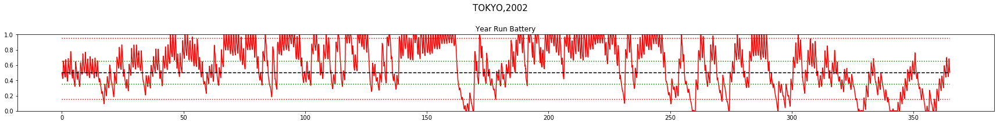

Day Violations           =    170
Battery Limit Violations =    779
Battery FULL Violations  =    595
Battery EMPTY Violations =    184


************************************
Anuual Average Reward    =  -2.71
Day Violations           =    172
Battery Limit Violations =    777
Battery FULL Violations  =    614
Battery EMPTY Violations =    163


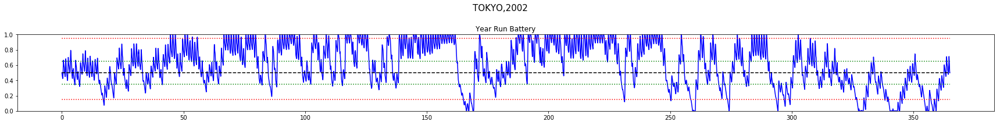


*****************************************
DAY: 1
REWARDS:  [-0.176  0.151  1.187  0.801  1.103  0.307 -4.802 -0.523  0.052  0.085]
EMPTY  :  [0 0 0 0 0 0 0 0 0 0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  480

CHECKING... 


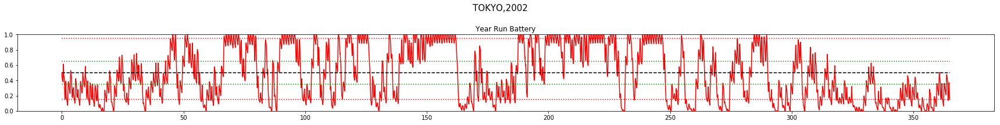

Day Violations           =    251
Battery Limit Violations =    799
Battery FULL Violations  =    593
Battery EMPTY Violations =    206


************************************
Anuual Average Reward    =  -3.84
Day Violations           =    249
Battery Limit Violations =    712
Battery FULL Violations  =    610
Battery EMPTY Violations =    102


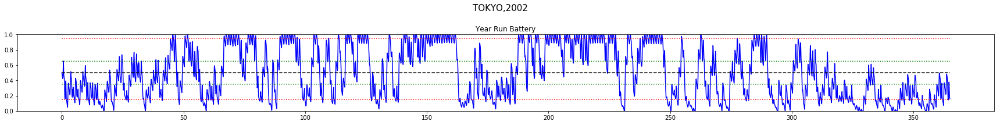


*****************************************
DAY: 2
REWARDS:  [ 0.431  1.185  1.212 -6.367  0.490  0.692 -4.981 -5.156  0.843  1.035]
EMPTY  :  [0 0 0 0 0 0 0 0 0 0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  720

CHECKING... 


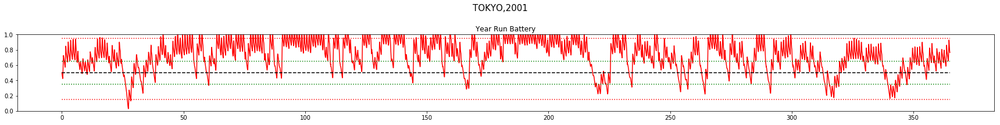

Day Violations           =    147
Battery Limit Violations =    632
Battery FULL Violations  =    632
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =  -2.98
Day Violations           =    151
Battery Limit Violations =    645
Battery FULL Violations  =    645
Battery EMPTY Violations =      0


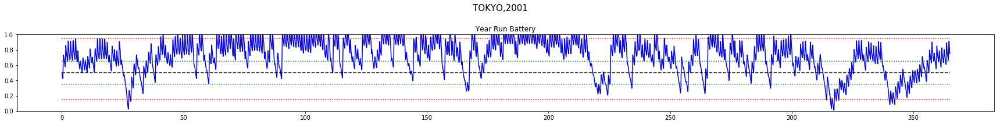


*****************************************
DAY: 3
REWARDS:  [ 1.483  0.976  0.278 -4.545  0.782  1.800 -8.300 -4.182  0.544  0.121]
EMPTY  :  [0 0 0 0 0 0 2 0 0 0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  960

CHECKING... 


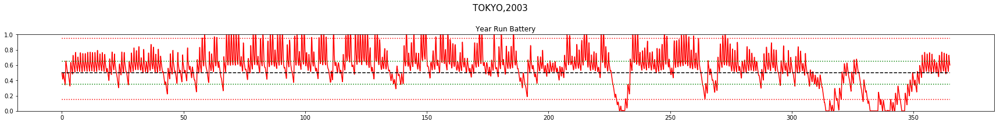

Day Violations           =    102
Battery Limit Violations =    395
Battery FULL Violations  =    166
Battery EMPTY Violations =    229


************************************
Anuual Average Reward    =  -0.88
Day Violations           =    108
Battery Limit Violations =    417
Battery FULL Violations  =    177
Battery EMPTY Violations =    240


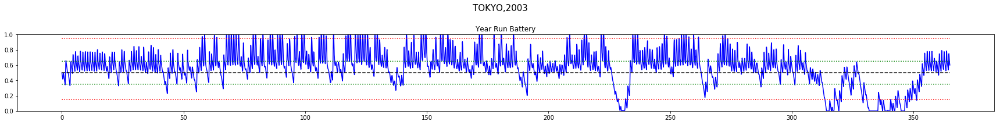


*****************************************
DAY: 4
REWARDS:  [ 1.375 -0.190  1.055 -2.909  1.776  0.131 -8.200 -1.887  0.182 -0.179]
EMPTY  :  [ 0  0  0  0  0  0 16  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  1200

CHECKING... 


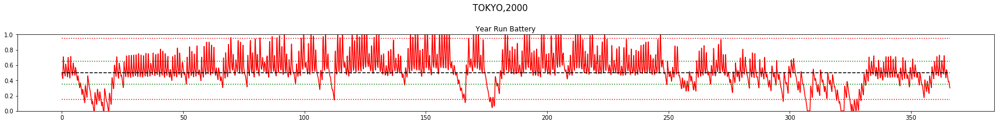

Day Violations           =     88
Battery Limit Violations =    170
Battery FULL Violations  =     89
Battery EMPTY Violations =     81


************************************
Anuual Average Reward    =  -0.04
Day Violations           =     91
Battery Limit Violations =    186
Battery FULL Violations  =    105
Battery EMPTY Violations =     81


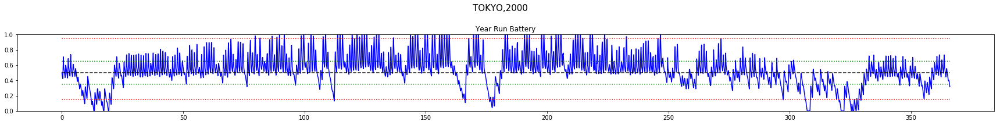


*****************************************
DAY: 5
REWARDS:  [ 1.510  0.906  1.080  0.341  1.091  1.409 -7.916 -6.322  1.361  1.000]
EMPTY  :  [ 0  0  0  0  0  0 24  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  1440

CHECKING... 


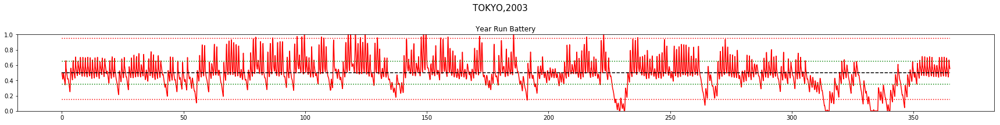

Day Violations           =     51
Battery Limit Violations =    137
Battery FULL Violations  =     19
Battery EMPTY Violations =    118


************************************
Anuual Average Reward    =   0.31
Day Violations           =     51
Battery Limit Violations =    125
Battery FULL Violations  =     18
Battery EMPTY Violations =    107


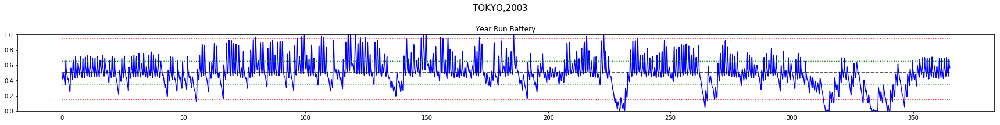


*****************************************
DAY: 6
REWARDS:  [-0.719  1.414  1.436  0.978  0.602  1.737 -3.349 -4.562  0.503  0.453]
EMPTY  :  [ 0  0  0  0  0  0 32  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  1680

CHECKING... 


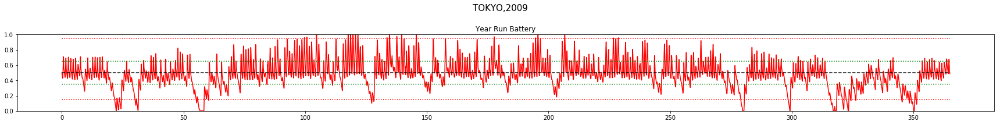

Day Violations           =     50
Battery Limit Violations =    103
Battery FULL Violations  =     19
Battery EMPTY Violations =     84


************************************
Anuual Average Reward    =   0.29
Day Violations           =     54
Battery Limit Violations =     97
Battery FULL Violations  =     26
Battery EMPTY Violations =     71


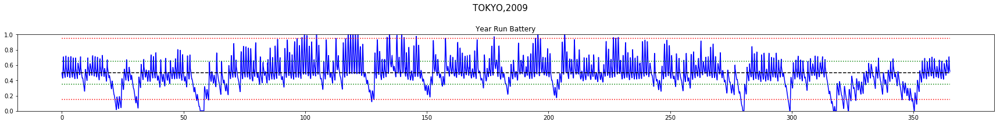


*****************************************
DAY: 7
REWARDS:  [-2.504  1.073  1.601  1.393  1.316  1.840  0.125 -1.707  1.997  1.551]
EMPTY  :  [ 0  0  0  0  0  0 32  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  1920

CHECKING... 


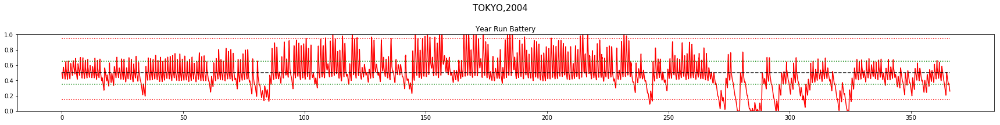

Day Violations           =     63
Battery Limit Violations =    133
Battery FULL Violations  =     35
Battery EMPTY Violations =     98


************************************
Anuual Average Reward    =   0.34
Day Violations           =     64
Battery Limit Violations =    129
Battery FULL Violations  =     41
Battery EMPTY Violations =     88


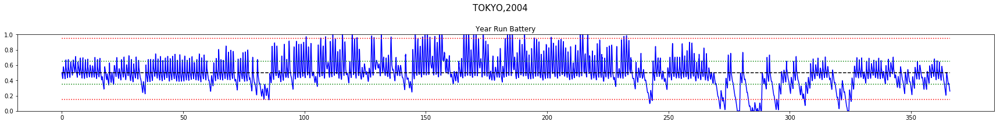


*****************************************
DAY: 8
REWARDS:  [-4.367  1.598  1.594  1.538  1.603  1.628  1.679  1.600  1.684 -1.157]
EMPTY  :  [ 0  0  0  0  0  0 32  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  2160

CHECKING... 


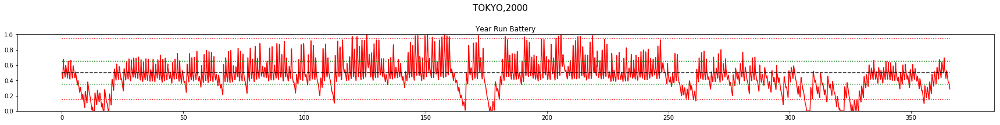

Day Violations           =     61
Battery Limit Violations =    131
Battery FULL Violations  =      5
Battery EMPTY Violations =    126


************************************
Anuual Average Reward    =   0.10
Day Violations           =     59
Battery Limit Violations =    115
Battery FULL Violations  =      6
Battery EMPTY Violations =    109


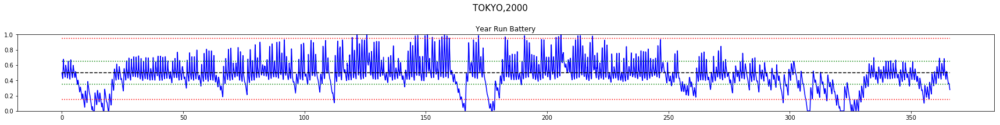


*****************************************
DAY: 9
REWARDS:  [-3.420  0.560  1.562  1.851  1.652  1.855  1.786  1.873  1.667  1.056]
EMPTY  :  [ 0  0  0  0  0  0 32  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  2400

CHECKING... 


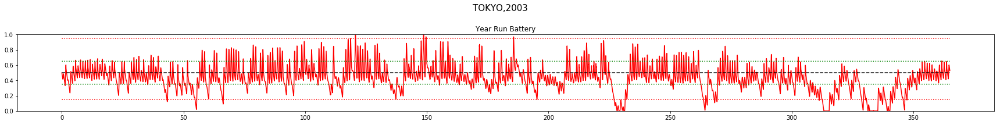

Day Violations           =     44
Battery Limit Violations =    169
Battery FULL Violations  =      1
Battery EMPTY Violations =    168


************************************
Anuual Average Reward    =  -0.13
Day Violations           =     45
Battery Limit Violations =    168
Battery FULL Violations  =      3
Battery EMPTY Violations =    165


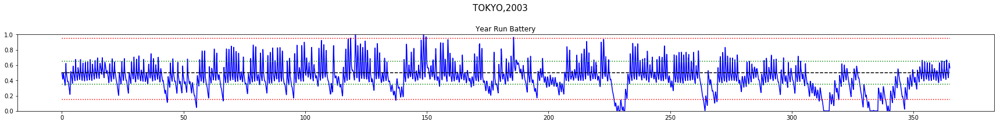


*****************************************
DAY: 10
REWARDS:  [-0.947  0.724  0.599  1.943  1.506  1.984  1.938  1.840  0.591  1.597]
EMPTY  :  [ 0  0  0  0  0  0 32  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  2640

CHECKING... 


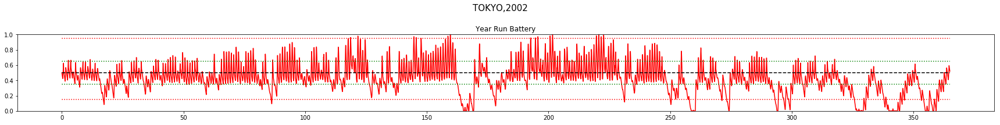

Day Violations           =     66
Battery Limit Violations =    244
Battery FULL Violations  =      4
Battery EMPTY Violations =    240


************************************
Anuual Average Reward    =  -0.50
Day Violations           =     65
Battery Limit Violations =    241
Battery FULL Violations  =      3
Battery EMPTY Violations =    238


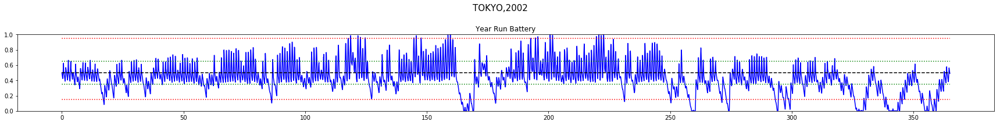


*****************************************
DAY: 11
REWARDS:  [-5.022  1.055  1.516  1.807  1.243  1.899  1.384  1.992 -1.044  0.980]
EMPTY  :  [ 0  0  0  0  0  0 32  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  2880

CHECKING... 


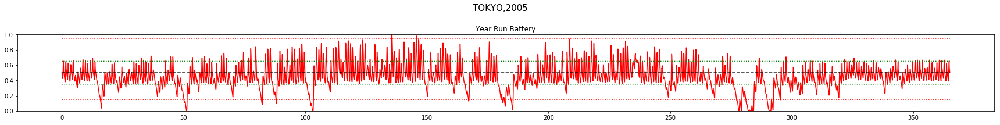

Day Violations           =     28
Battery Limit Violations =     70
Battery FULL Violations  =      1
Battery EMPTY Violations =     69


************************************
Anuual Average Reward    =   0.08
Day Violations           =     30
Battery Limit Violations =     67
Battery FULL Violations  =      1
Battery EMPTY Violations =     66


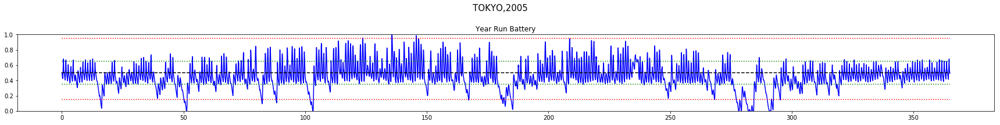


*****************************************
DAY: 12
REWARDS:  [-7.729 -1.070  1.414  1.409  0.828  1.670 -2.556  1.242 -1.422  1.340]
EMPTY  :  [ 0  0  0  0  0  0 32  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  3120
LOSS : 0.901

CHECKING... 


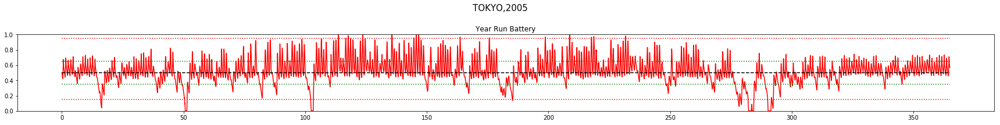

Day Violations           =     31
Battery Limit Violations =    106
Battery FULL Violations  =      5
Battery EMPTY Violations =    101


************************************
Anuual Average Reward    =   0.67
Day Violations           =     28
Battery Limit Violations =     99
Battery FULL Violations  =      6
Battery EMPTY Violations =     93


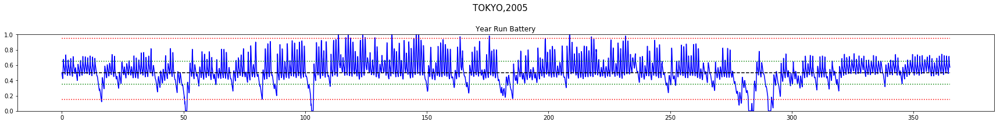


*****************************************
DAY: 13
REWARDS:  [-4.731  1.439  1.253  1.160  1.173  0.911 -8.700  1.068 -2.883  0.899]
EMPTY  :  [ 8  0  0  0  0  0 43  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  3360

CHECKING... 


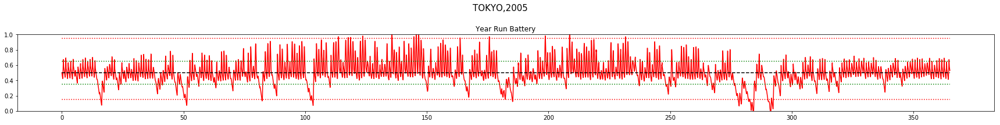

Day Violations           =     30
Battery Limit Violations =     17
Battery FULL Violations  =      5
Battery EMPTY Violations =     12


************************************
Anuual Average Reward    =   0.78
Day Violations           =     26
Battery Limit Violations =      6
Battery FULL Violations  =      6
Battery EMPTY Violations =      0


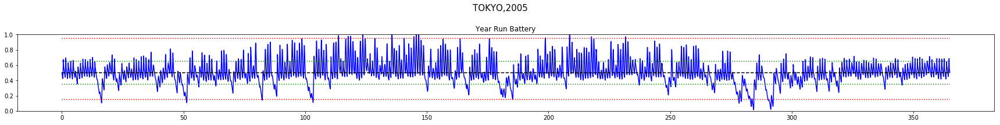


*****************************************
DAY: 14
REWARDS:  [-3.747  1.628  0.630  1.342  1.545 -0.710 -3.185  1.660 -1.314  1.878]
EMPTY  :  [ 8  0  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  3600

CHECKING... 


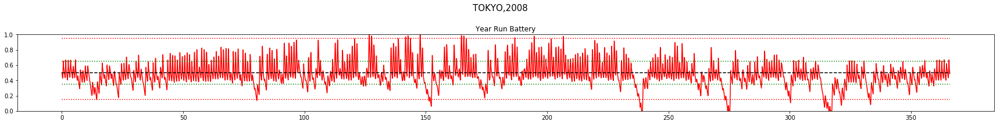

Day Violations           =     29
Battery Limit Violations =     44
Battery FULL Violations  =      4
Battery EMPTY Violations =     40


************************************
Anuual Average Reward    =   0.63
Day Violations           =     26
Battery Limit Violations =     16
Battery FULL Violations  =      3
Battery EMPTY Violations =     13


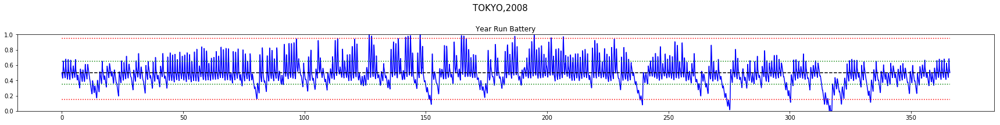


*****************************************
DAY: 15
REWARDS:  [-4.264  1.918  0.142  1.130  1.624 -4.168 -4.807  1.947  0.911  1.749]
EMPTY  :  [ 8  0  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  3840

CHECKING... 


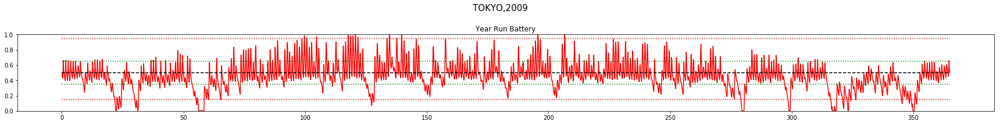

Day Violations           =     46
Battery Limit Violations =    143
Battery FULL Violations  =      5
Battery EMPTY Violations =    138


************************************
Anuual Average Reward    =   0.13
Day Violations           =     45
Battery Limit Violations =    116
Battery FULL Violations  =      0
Battery EMPTY Violations =    116


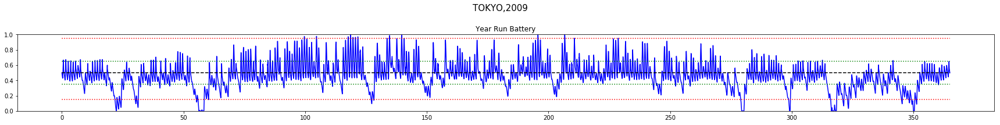


*****************************************
DAY: 16
REWARDS:  [-8.400  1.628 -2.841  1.654 -0.164 -0.889 -2.700 -1.556  1.993  1.722]
EMPTY  :  [13  0  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  4080

CHECKING... 


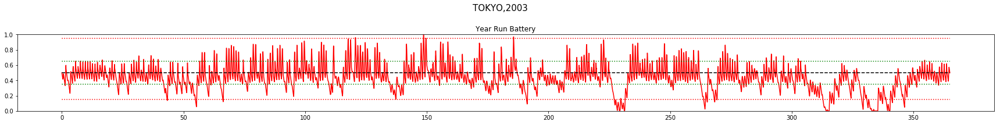

Day Violations           =     42
Battery Limit Violations =     93
Battery FULL Violations  =      2
Battery EMPTY Violations =     91


************************************
Anuual Average Reward    =  -0.05
Day Violations           =     40
Battery Limit Violations =     66
Battery FULL Violations  =      2
Battery EMPTY Violations =     64


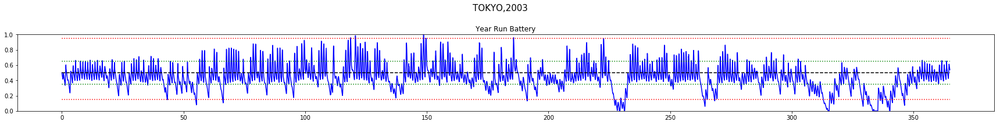


*****************************************
DAY: 17
REWARDS:  [-3.885  1.777 -0.767  1.390  1.441  1.419 -3.079 -1.746 -0.261  0.137]
EMPTY  :  [21  0  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  4320

CHECKING... 


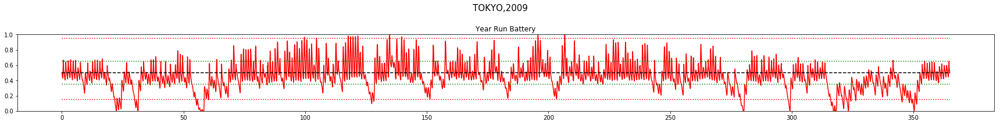

Day Violations           =     45
Battery Limit Violations =     60
Battery FULL Violations  =      1
Battery EMPTY Violations =     59


************************************
Anuual Average Reward    =   0.11
Day Violations           =     43
Battery Limit Violations =     28
Battery FULL Violations  =      5
Battery EMPTY Violations =     23


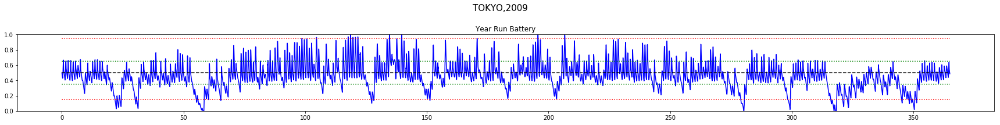


*****************************************
DAY: 18
REWARDS:  [-6.124  1.018  0.567  0.056 -0.587  1.375  0.262 -0.797  1.310  1.343]
EMPTY  :  [21  0  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  4560

CHECKING... 


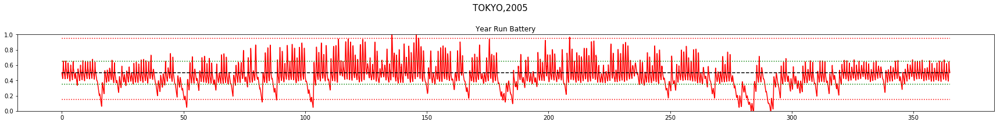

Day Violations           =     26
Battery Limit Violations =     12
Battery FULL Violations  =      1
Battery EMPTY Violations =     11


************************************
Anuual Average Reward    =   0.38
Day Violations           =     20
Battery Limit Violations =      3
Battery FULL Violations  =      3
Battery EMPTY Violations =      0


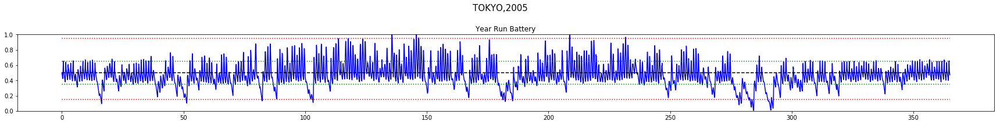


*****************************************
DAY: 19
REWARDS:  [-4.637  0.996  1.783  1.237  1.132  1.891  1.356 -3.525  1.608 -1.394]
EMPTY  :  [21  0  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  4800

CHECKING... 


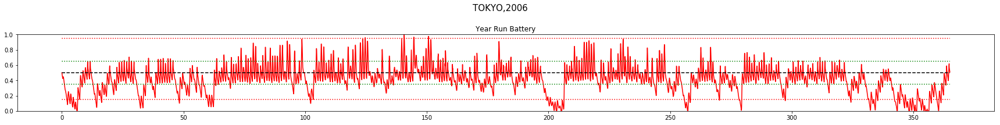

Day Violations           =     62
Battery Limit Violations =     73
Battery FULL Violations  =      1
Battery EMPTY Violations =     72


************************************
Anuual Average Reward    =  -0.38
Day Violations           =     57
Battery Limit Violations =     46
Battery FULL Violations  =      1
Battery EMPTY Violations =     45


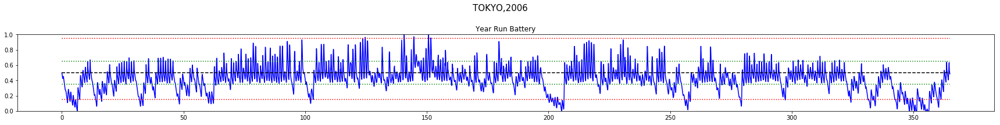


*****************************************
DAY: 20
REWARDS:  [-0.885  0.755 -2.395  1.572  0.281  0.781 -2.469 -3.494 -0.532 -2.434]
EMPTY  :  [21  0  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  5040

CHECKING... 


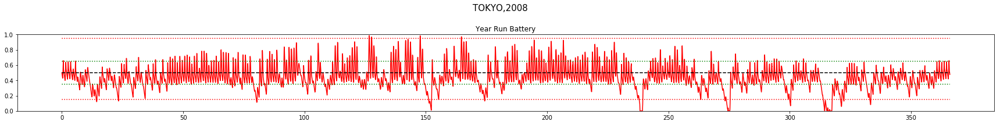

Day Violations           =     27
Battery Limit Violations =     82
Battery FULL Violations  =      0
Battery EMPTY Violations =     82


************************************
Anuual Average Reward    =   0.03
Day Violations           =     27
Battery Limit Violations =     27
Battery FULL Violations  =      0
Battery EMPTY Violations =     27


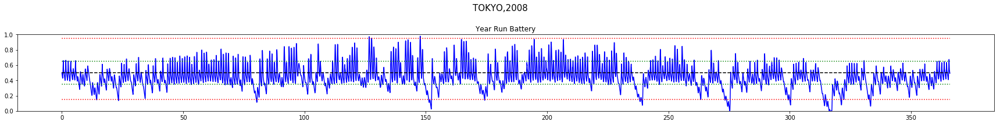


*****************************************
DAY: 21
REWARDS:  [ 1.603  0.462  0.473  1.145  1.087  0.845 -1.296 -1.751 -0.015 -5.454]
EMPTY  :  [21  0  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  5280

CHECKING... 


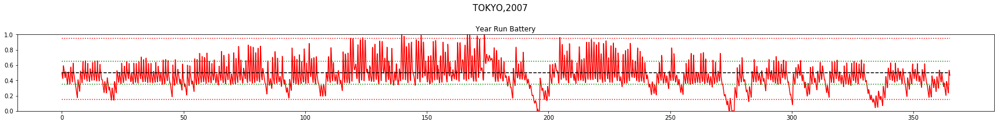

Day Violations           =     30
Battery Limit Violations =     52
Battery FULL Violations  =      3
Battery EMPTY Violations =     49


************************************
Anuual Average Reward    =   0.16
Day Violations           =     25
Battery Limit Violations =     44
Battery FULL Violations  =      1
Battery EMPTY Violations =     43


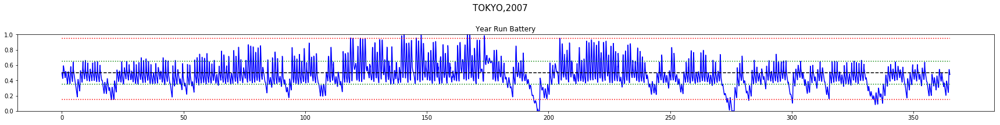


*****************************************
DAY: 22
REWARDS:  [ 1.310  0.563  1.077 -3.046  1.338 -1.641  0.600  1.126 -3.427 -5.411]
EMPTY  :  [21  0  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  5520

CHECKING... 


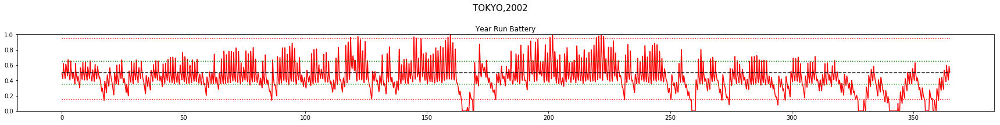

Day Violations           =     51
Battery Limit Violations =    291
Battery FULL Violations  =      1
Battery EMPTY Violations =    290


************************************
Anuual Average Reward    =  -0.31
Day Violations           =     43
Battery Limit Violations =    242
Battery FULL Violations  =      2
Battery EMPTY Violations =    240


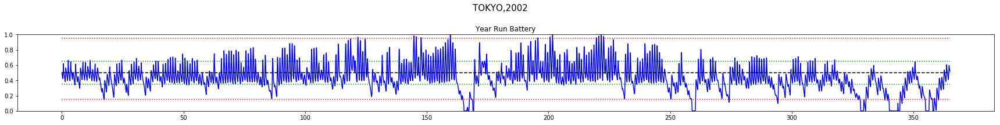


*****************************************
DAY: 23
REWARDS:  [ 1.445  0.486  1.946 -0.065  0.814 -0.412  0.895  0.841 -0.019 -5.046]
EMPTY  :  [21  0  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  5760

CHECKING... 


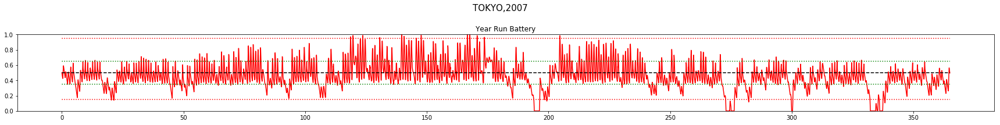

Day Violations           =     36
Battery Limit Violations =    214
Battery FULL Violations  =      3
Battery EMPTY Violations =    211


************************************
Anuual Average Reward    =   0.09
Day Violations           =     31
Battery Limit Violations =    169
Battery FULL Violations  =      3
Battery EMPTY Violations =    166


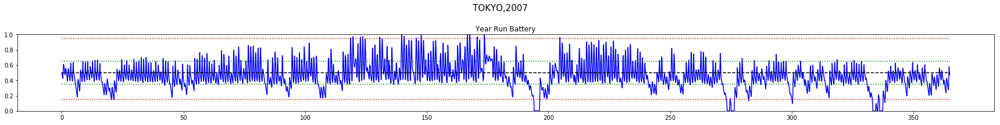


*****************************************
DAY: 24
REWARDS:  [-1.760 -2.028  0.916  1.172  1.261  1.572  0.646  0.742  0.418 -0.501]
EMPTY  :  [21  0  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  6000
LOSS : 1.013

CHECKING... 


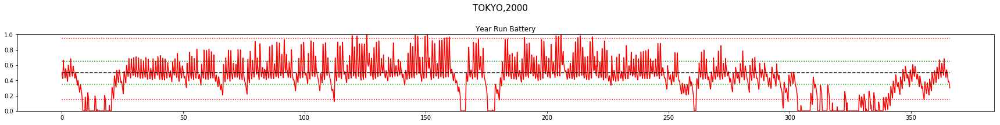

Day Violations           =     83
Battery Limit Violations =    850
Battery FULL Violations  =      2
Battery EMPTY Violations =    848


************************************
Anuual Average Reward    =  -0.76
Day Violations           =     94
Battery Limit Violations =   1105
Battery FULL Violations  =      2
Battery EMPTY Violations =   1103


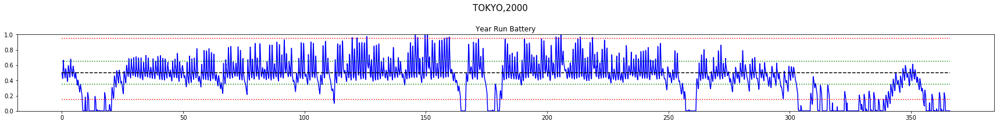


*****************************************
DAY: 25
REWARDS:  [ 1.181 -8.800 -1.008  1.909  1.849  0.521  1.593  1.884  1.714  1.358]
EMPTY  :  [21  9  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  6240

CHECKING... 


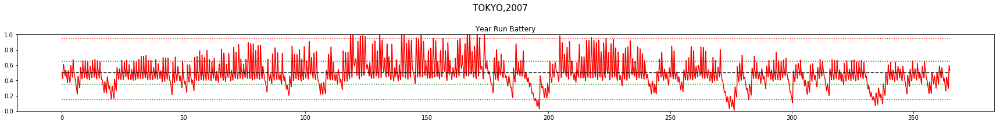

Day Violations           =     30
Battery Limit Violations =     10
Battery FULL Violations  =     10
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   0.58
Day Violations           =     30
Battery Limit Violations =      9
Battery FULL Violations  =      9
Battery EMPTY Violations =      0


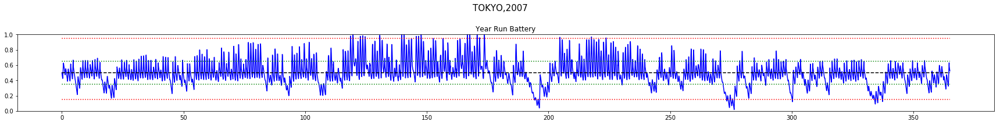


*****************************************
DAY: 26
REWARDS:  [ 1.804 -8.100 -2.342 -1.657  1.407  1.506  1.538  1.728  1.792  1.678]
EMPTY  :  [21 31  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  6480

CHECKING... 


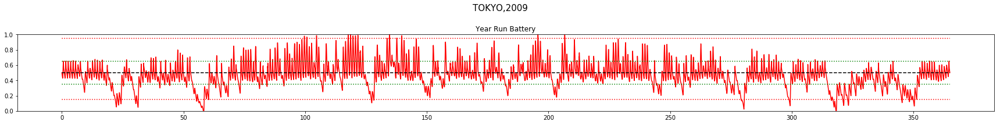

Day Violations           =     42
Battery Limit Violations =     13
Battery FULL Violations  =      4
Battery EMPTY Violations =      9


************************************
Anuual Average Reward    =   0.39
Day Violations           =     35
Battery Limit Violations =     12
Battery FULL Violations  =      4
Battery EMPTY Violations =      8


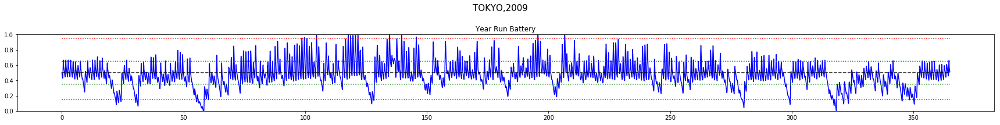


*****************************************
DAY: 27
REWARDS:  [ 1.486 -3.200  1.536  1.110  1.777  1.716  1.601  1.770  0.740  1.903]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  6720

CHECKING... 


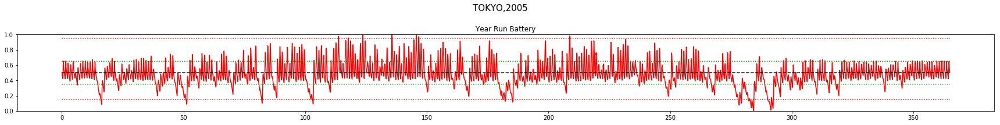

Day Violations           =     22
Battery Limit Violations =      3
Battery FULL Violations  =      2
Battery EMPTY Violations =      1


************************************
Anuual Average Reward    =   0.70
Day Violations           =     22
Battery Limit Violations =      2
Battery FULL Violations  =      2
Battery EMPTY Violations =      0


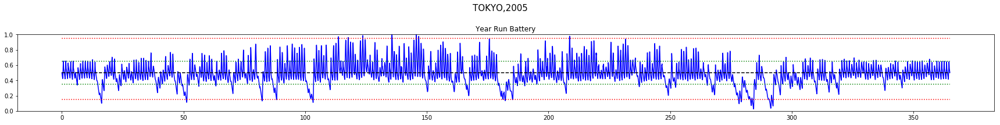


*****************************************
DAY: 28
REWARDS:  [ 1.706  1.377  1.662  1.760  1.856  0.946  1.282  1.389 -0.481 -0.151]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  6960

CHECKING... 


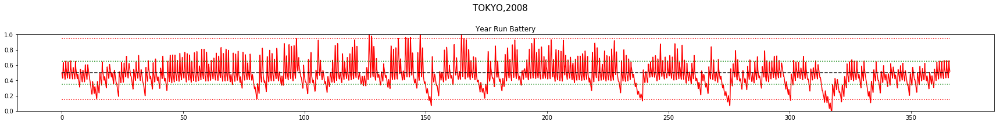

Day Violations           =     20
Battery Limit Violations =      8
Battery FULL Violations  =      2
Battery EMPTY Violations =      6


************************************
Anuual Average Reward    =   0.64
Day Violations           =     17
Battery Limit Violations =      7
Battery FULL Violations  =      2
Battery EMPTY Violations =      5


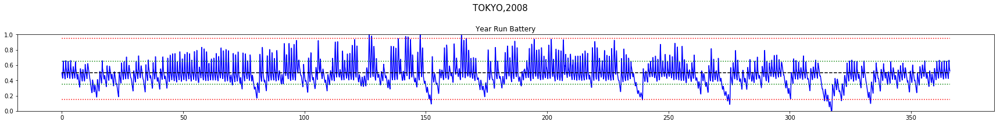


*****************************************
DAY: 29
REWARDS:  [ 1.936  1.736  1.817  1.570  1.792  1.601  1.698  1.883  1.547 -3.471]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  7200

CHECKING... 


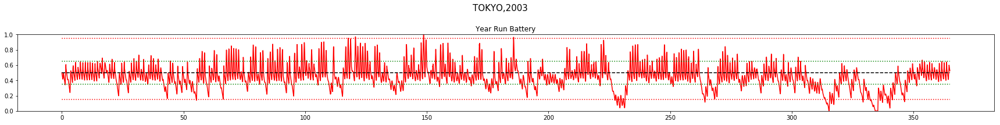

Day Violations           =     27
Battery Limit Violations =     29
Battery FULL Violations  =      1
Battery EMPTY Violations =     28


************************************
Anuual Average Reward    =   0.33
Day Violations           =     23
Battery Limit Violations =     16
Battery FULL Violations  =      1
Battery EMPTY Violations =     15


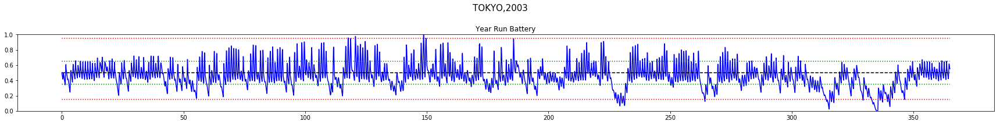


*****************************************
DAY: 30
REWARDS:  [ 1.793  1.730  1.253  1.622  1.628  1.214 -1.472  1.368  1.850 -4.758]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  7440

CHECKING... 


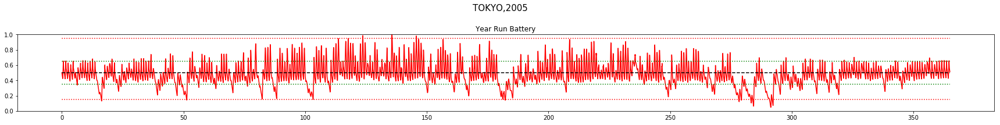

Day Violations           =     13
Battery Limit Violations =      1
Battery FULL Violations  =      1
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   0.68
Day Violations           =     10
Battery Limit Violations =      1
Battery FULL Violations  =      1
Battery EMPTY Violations =      0


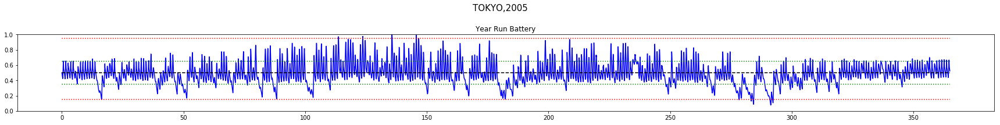


*****************************************
DAY: 31
REWARDS:  [ 1.653 -1.485  1.762  1.763  1.825  1.539 -3.817  1.675  1.574  0.483]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  7680

CHECKING... 


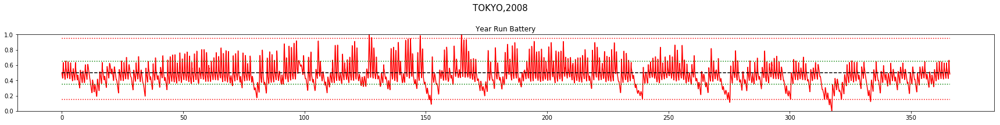

Day Violations           =     11
Battery Limit Violations =      2
Battery FULL Violations  =      1
Battery EMPTY Violations =      1


************************************
Anuual Average Reward    =   0.65
Day Violations           =     10
Battery Limit Violations =      1
Battery FULL Violations  =      1
Battery EMPTY Violations =      0


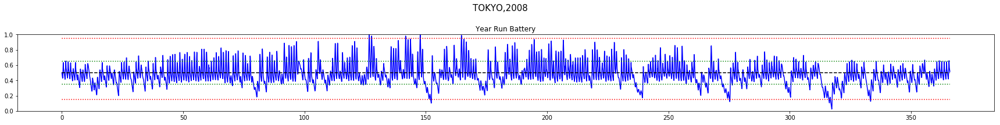


*****************************************
DAY: 32
REWARDS:  [ 1.330 -2.989  1.835  1.688 -2.063  1.544 -3.519  1.492  1.691  1.553]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  7920

CHECKING... 


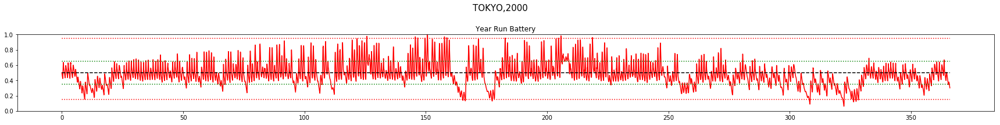

Day Violations           =     20
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   0.60
Day Violations           =     17
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


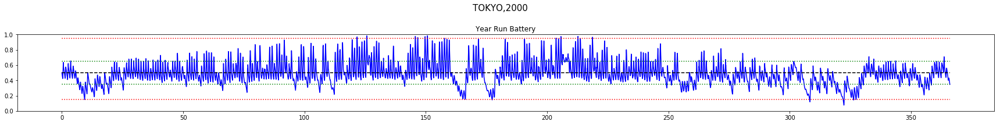


*****************************************
DAY: 33
REWARDS:  [ 1.690  1.476 -1.799  1.398 -2.134  1.697 -0.360  1.657 -1.636  1.922]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  8160

CHECKING... 


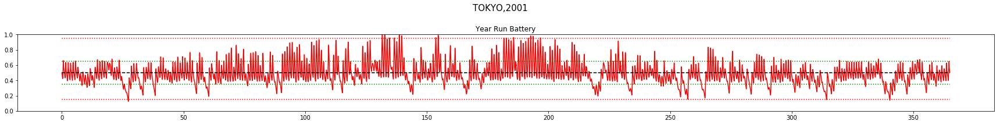

Day Violations           =     18
Battery Limit Violations =      2
Battery FULL Violations  =      2
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   0.79
Day Violations           =     18
Battery Limit Violations =      1
Battery FULL Violations  =      1
Battery EMPTY Violations =      0


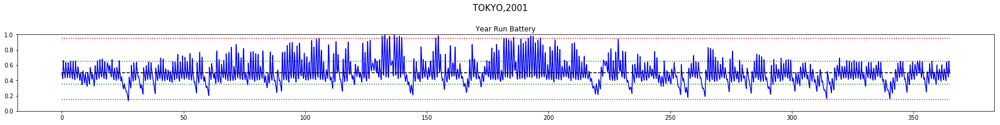


*****************************************
DAY: 34
REWARDS:  [ 1.993  1.817 -0.031  0.820  1.032  1.467  1.747  1.894  1.040  1.240]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  8400

CHECKING... 


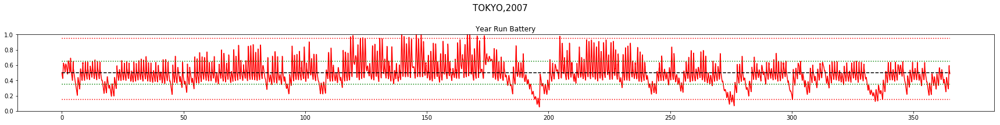

Day Violations           =     23
Battery Limit Violations =      3
Battery FULL Violations  =      3
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   0.61
Day Violations           =     23
Battery Limit Violations =      5
Battery FULL Violations  =      5
Battery EMPTY Violations =      0


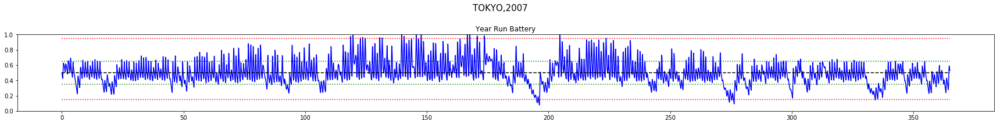


*****************************************
DAY: 35
REWARDS:  [ 1.944  1.802 -0.456  1.806  1.252  1.947  1.063  1.567  1.845  0.906]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  8640

CHECKING... 


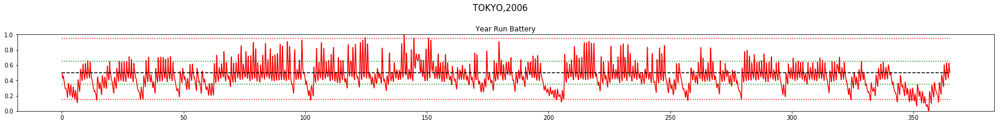

Day Violations           =     24
Battery Limit Violations =      4
Battery FULL Violations  =      0
Battery EMPTY Violations =      4


************************************
Anuual Average Reward    =   0.39
Day Violations           =     16
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


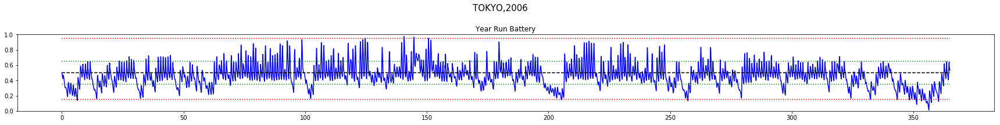


*****************************************
DAY: 36
REWARDS:  [ 1.571  1.907  1.905  1.900  1.032  1.823 -0.257  1.168 -1.086  1.694]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  8880
LOSS : 1.182

CHECKING... 


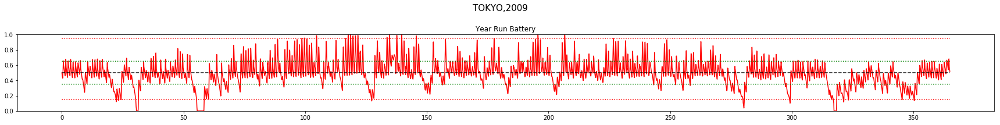

Day Violations           =     36
Battery Limit Violations =    112
Battery FULL Violations  =      7
Battery EMPTY Violations =    105


************************************
Anuual Average Reward    =   0.59
Day Violations           =     26
Battery Limit Violations =     73
Battery FULL Violations  =      7
Battery EMPTY Violations =     66


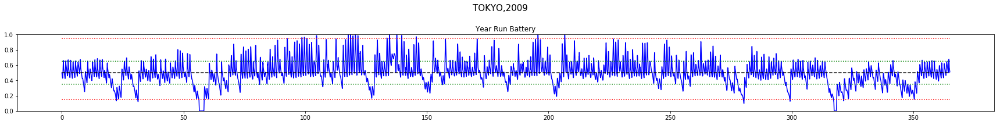


*****************************************
DAY: 37
REWARDS:  [ 1.870 -2.277  1.291  1.894  1.375  1.581 -2.131  1.399  1.866  1.914]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  9120

CHECKING... 


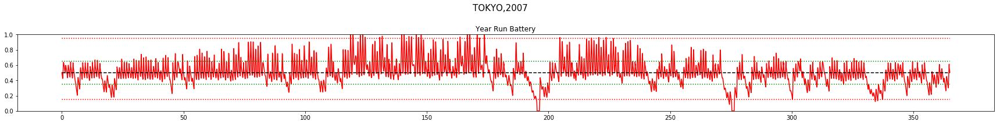

Day Violations           =     32
Battery Limit Violations =     55
Battery FULL Violations  =     10
Battery EMPTY Violations =     45


************************************
Anuual Average Reward    =   0.74
Day Violations           =     30
Battery Limit Violations =     52
Battery FULL Violations  =     10
Battery EMPTY Violations =     42


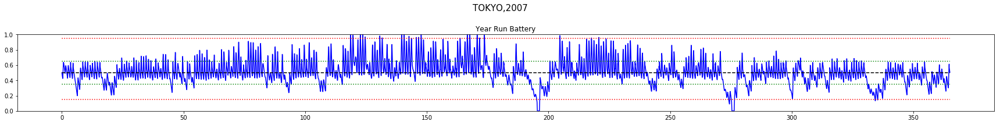


*****************************************
DAY: 38
REWARDS:  [ 1.696  1.343  1.664  1.689  1.845 -2.139  1.512  1.704  1.743  1.433]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  9360

CHECKING... 


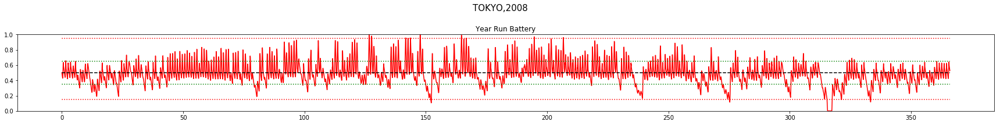

Day Violations           =     16
Battery Limit Violations =     44
Battery FULL Violations  =      2
Battery EMPTY Violations =     42


************************************
Anuual Average Reward    =   0.85
Day Violations           =     13
Battery Limit Violations =     26
Battery FULL Violations  =      2
Battery EMPTY Violations =     24


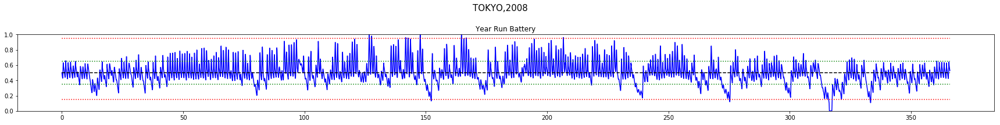


*****************************************
DAY: 39
REWARDS:  [ 1.906  1.844  1.878  1.973  1.679 -0.880  1.863  1.693 -0.403 -0.305]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  9600

CHECKING... 


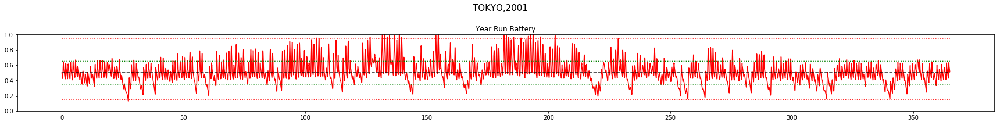

Day Violations           =     22
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   0.90
Day Violations           =     23
Battery Limit Violations =     10
Battery FULL Violations  =     10
Battery EMPTY Violations =      0


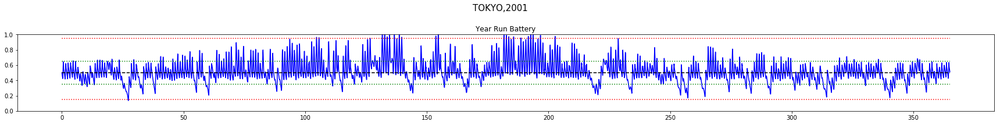


*****************************************
DAY: 40
REWARDS:  [ 1.798  1.783  0.547  0.783  1.966  0.421  1.573  1.512  1.675  1.739]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  9840

CHECKING... 


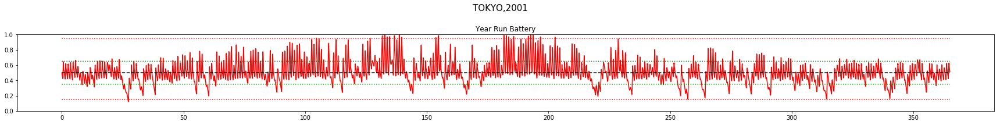

Day Violations           =     21
Battery Limit Violations =      5
Battery FULL Violations  =      5
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   0.91
Day Violations           =     23
Battery Limit Violations =     10
Battery FULL Violations  =     10
Battery EMPTY Violations =      0


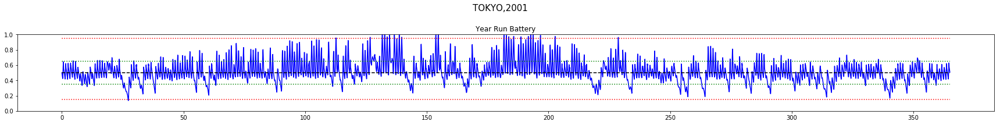


*****************************************
DAY: 41
REWARDS:  [ 1.820  1.852  1.477  0.145  1.445  1.247  1.648  1.844  1.636  0.499]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  10080

CHECKING... 


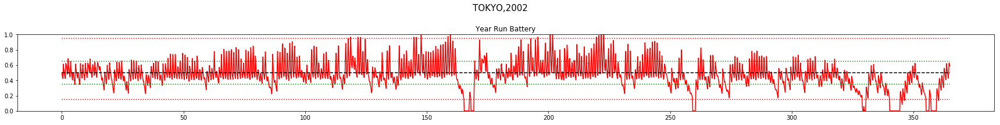

Day Violations           =     38
Battery Limit Violations =    298
Battery FULL Violations  =      9
Battery EMPTY Violations =    289


************************************
Anuual Average Reward    =   0.43
Day Violations           =     38
Battery Limit Violations =    262
Battery FULL Violations  =      6
Battery EMPTY Violations =    256


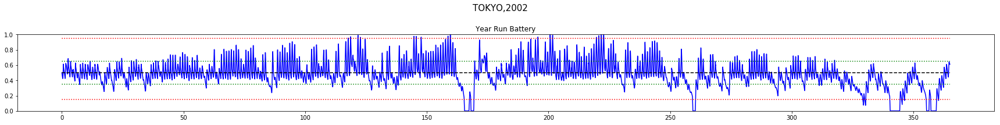


*****************************************
DAY: 42
REWARDS:  [ 1.939  1.242  1.979 -1.338  1.747  1.579  1.642  1.593 -0.762  1.483]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  10320

CHECKING... 


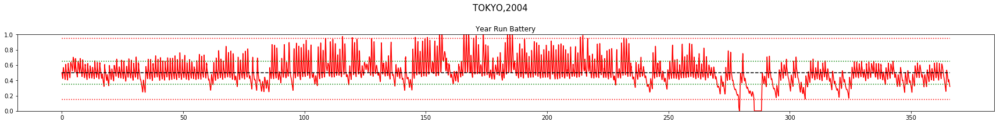

Day Violations           =     24
Battery Limit Violations =     90
Battery FULL Violations  =     18
Battery EMPTY Violations =     72


************************************
Anuual Average Reward    =   0.86
Day Violations           =     23
Battery Limit Violations =     85
Battery FULL Violations  =     18
Battery EMPTY Violations =     67


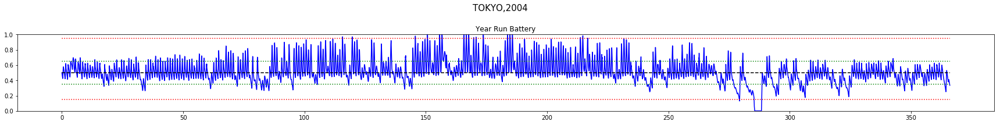


*****************************************
DAY: 43
REWARDS:  [ 1.918  1.014  1.897  1.569  1.549  0.581  1.927  1.906  1.652  0.963]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  10560

CHECKING... 


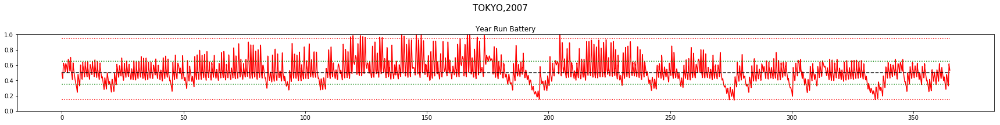

Day Violations           =     19
Battery Limit Violations =     11
Battery FULL Violations  =     11
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   0.87
Day Violations           =     18
Battery Limit Violations =     31
Battery FULL Violations  =     11
Battery EMPTY Violations =     20


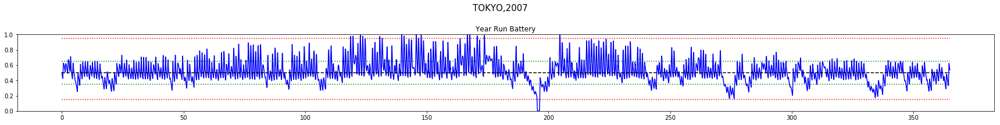


*****************************************
DAY: 44
REWARDS:  [ 0.864  1.171  1.774  1.530  1.620  1.901  1.914 -1.189  1.818  1.616]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  10800

CHECKING... 


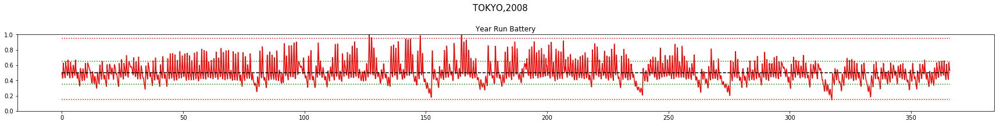

Day Violations           =      5
Battery Limit Violations =      1
Battery FULL Violations  =      1
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.08
Day Violations           =      5
Battery Limit Violations =      1
Battery FULL Violations  =      1
Battery EMPTY Violations =      0


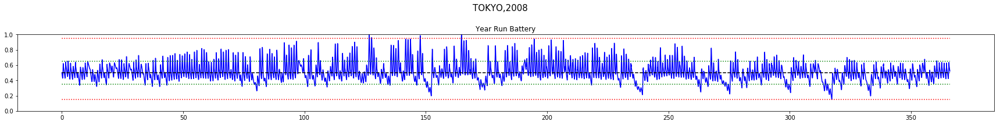


*****************************************
DAY: 45
REWARDS:  [ 1.906  1.894  1.881  1.369  1.609  1.909  1.343  1.085  1.952  1.858]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  11040

CHECKING... 


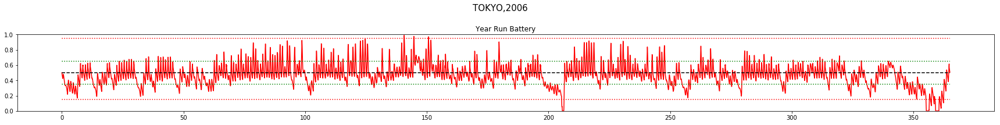

Day Violations           =     13
Battery Limit Violations =     71
Battery FULL Violations  =      0
Battery EMPTY Violations =     71


************************************
Anuual Average Reward    =   0.72
Day Violations           =     10
Battery Limit Violations =     55
Battery FULL Violations  =      1
Battery EMPTY Violations =     54


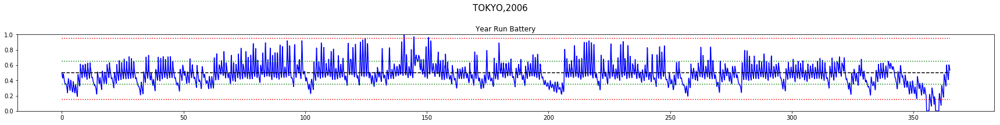


*****************************************
DAY: 46
REWARDS:  [ 1.898  1.321  1.695 -0.719  1.377 -0.514 -0.500  1.263  1.730  1.656]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  11280

CHECKING... 


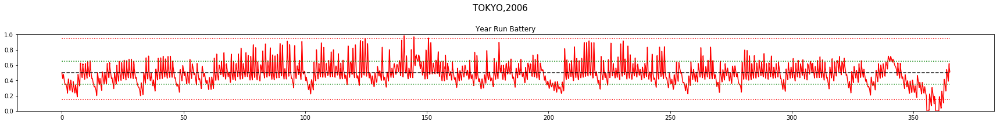

Day Violations           =     11
Battery Limit Violations =     51
Battery FULL Violations  =      0
Battery EMPTY Violations =     51


************************************
Anuual Average Reward    =   0.75
Day Violations           =     11
Battery Limit Violations =     58
Battery FULL Violations  =      0
Battery EMPTY Violations =     58


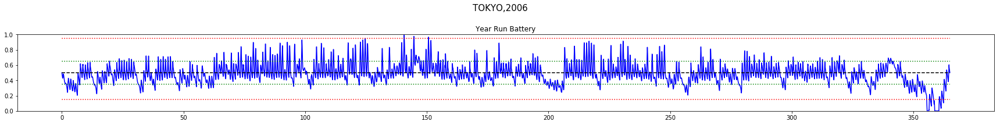


*****************************************
DAY: 47
REWARDS:  [ 1.539  1.945  1.804  1.633  1.385  1.767 -1.443  1.202  1.815  1.833]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  11520

CHECKING... 


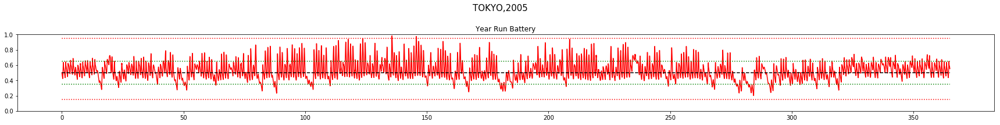

Day Violations           =      2
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.10
Day Violations           =      5
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


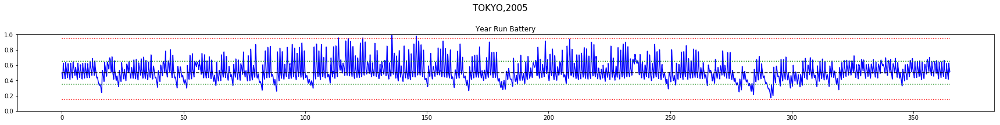


*****************************************
DAY: 48
REWARDS:  [ 1.548  1.228  1.791  0.089  1.730  1.785  1.466  0.727  1.903  1.479]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  11760
LOSS : 1.424

CHECKING... 


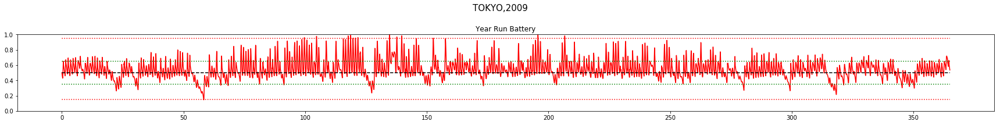

Day Violations           =     14
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.01
Day Violations           =     16
Battery Limit Violations =      3
Battery FULL Violations  =      3
Battery EMPTY Violations =      0


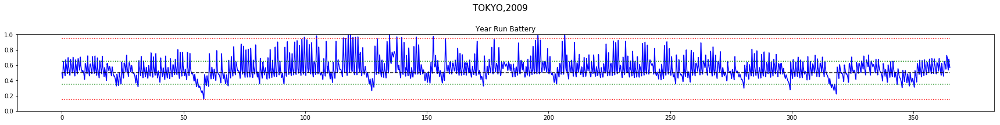


*****************************************
DAY: 49
REWARDS:  [ 1.203  1.951  1.526  1.598  1.714  1.182  1.411  1.718  1.765  1.704]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  12000

CHECKING... 


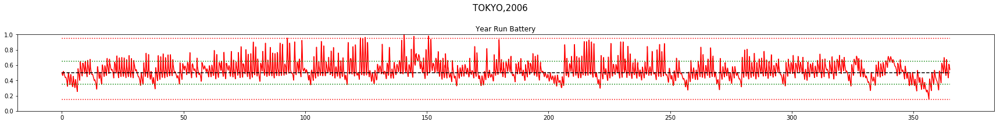

Day Violations           =      6
Battery Limit Violations =      1
Battery FULL Violations  =      1
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.14
Day Violations           =      6
Battery Limit Violations =      1
Battery FULL Violations  =      1
Battery EMPTY Violations =      0


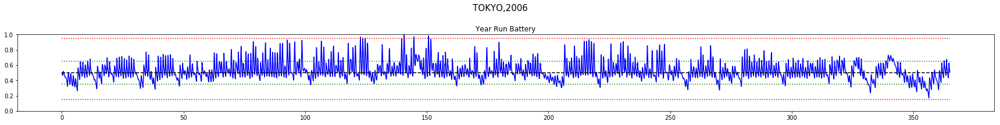


*****************************************
DAY: 50
REWARDS:  [ 1.653  1.632  1.709  1.765  1.434  0.726  1.854  1.237  1.968  0.936]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  12240

CHECKING... 


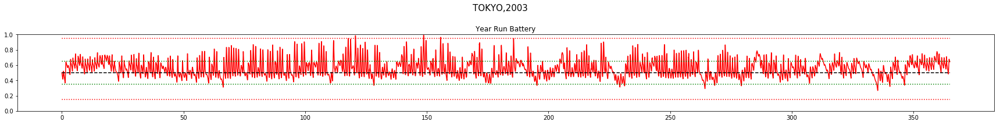

Day Violations           =      3
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   0.95
Day Violations           =      5
Battery Limit Violations =      1
Battery FULL Violations  =      1
Battery EMPTY Violations =      0


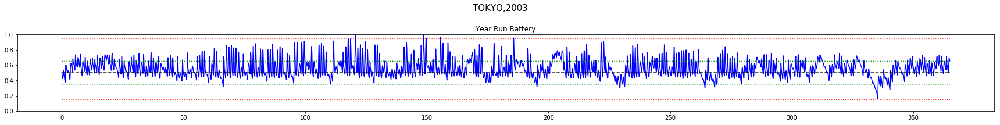


*****************************************
DAY: 51
REWARDS:  [ 1.578  1.737  1.988  1.817  1.652  1.971  0.997  1.804  1.717  1.991]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  12480

CHECKING... 


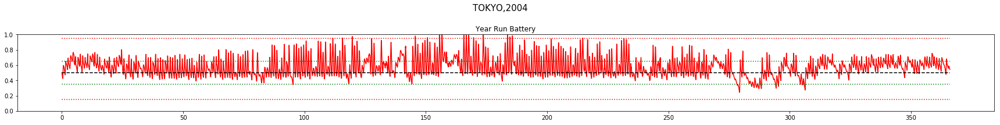

Day Violations           =     16
Battery Limit Violations =      4
Battery FULL Violations  =      4
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   0.79
Day Violations           =     14
Battery Limit Violations =      4
Battery FULL Violations  =      4
Battery EMPTY Violations =      0


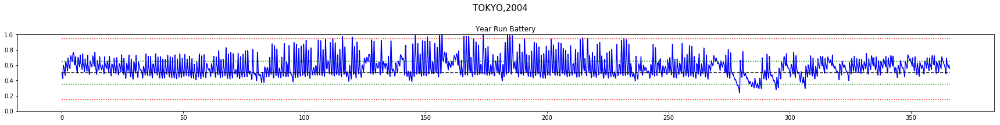


*****************************************
DAY: 52
REWARDS:  [ 1.685  1.690  1.468  1.515  1.907  1.338  1.247  1.532  1.783  1.960]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  12720

CHECKING... 


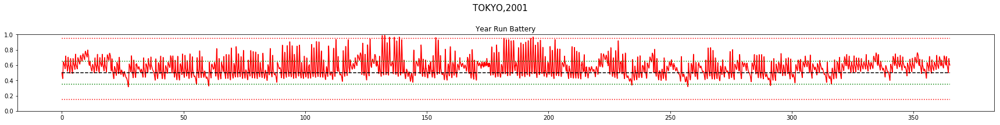

Day Violations           =      9
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   0.85
Day Violations           =      8
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


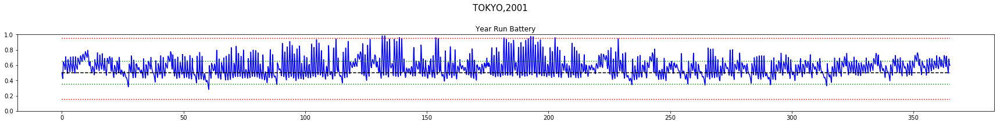


*****************************************
DAY: 53
REWARDS:  [ 1.898  1.771  1.446  1.727  1.409  1.916  1.237  1.365  1.805  0.593]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  12960

CHECKING... 


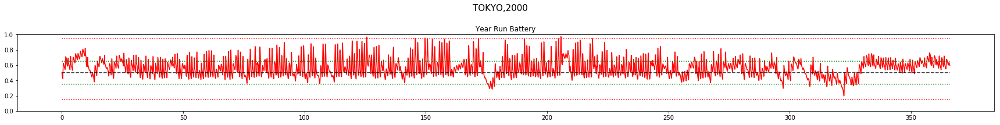

Day Violations           =      4
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   0.88
Day Violations           =      3
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


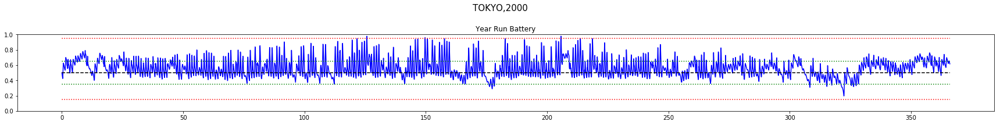


*****************************************
DAY: 54
REWARDS:  [ 1.718  0.702 -0.148  0.546  1.878  0.044  1.698  1.992  1.705 -0.455]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  13200

CHECKING... 


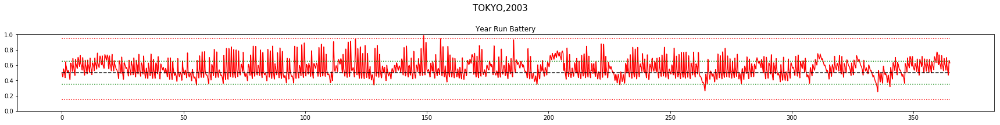

Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.02
Day Violations           =      2
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


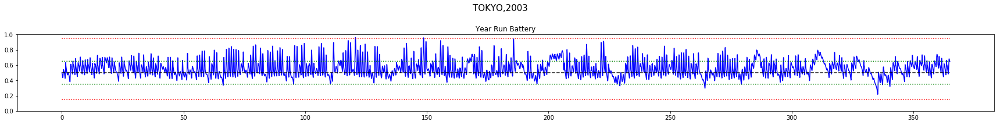


*****************************************
DAY: 55
REWARDS:  [ 1.803  1.965  1.809  1.604  1.861  0.275  1.925  1.940  1.815 -0.516]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  13440

CHECKING... 


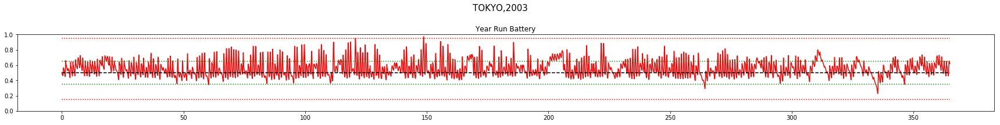

Day Violations           =      2
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.08
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


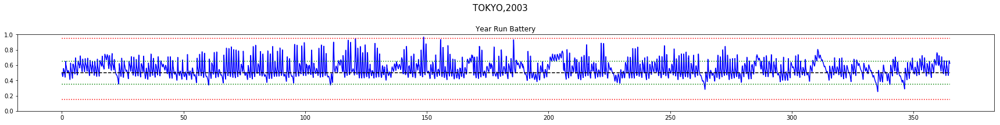


*****************************************
DAY: 56
REWARDS:  [ 1.326  1.909  1.270  1.653  1.764  1.559  0.718  1.766  1.386 -1.690]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  13680

CHECKING... 


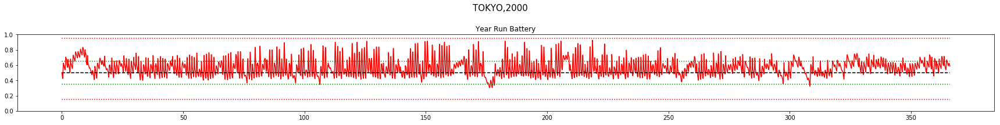

Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.03
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


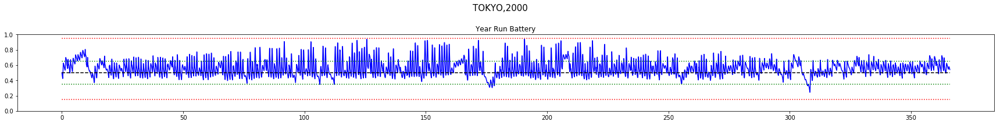


*****************************************
DAY: 57
REWARDS:  [ 1.597  1.827 -0.171  1.902  1.845  1.586  0.863  1.307  1.675 -2.910]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  13920

CHECKING... 


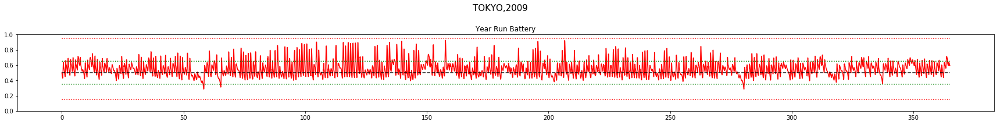

Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.32
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


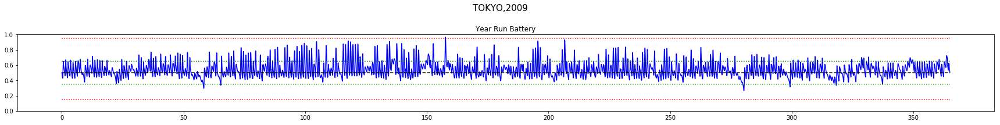


*****************************************
DAY: 58
REWARDS:  [ 1.889  1.513  0.522  1.494  1.847  1.664  1.460  1.856  1.342  0.425]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  14160

CHECKING... 


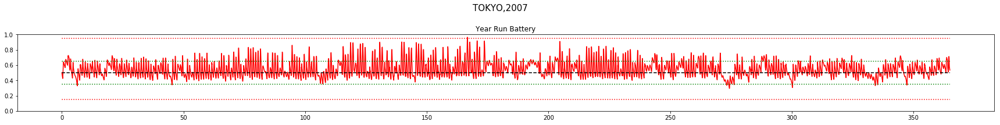

Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.22
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


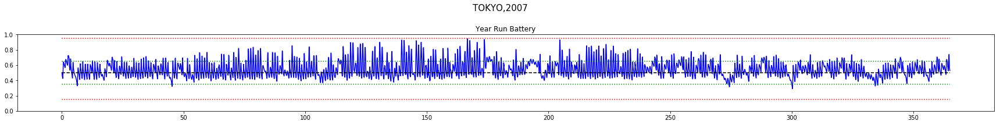


*****************************************
DAY: 59
REWARDS:  [ 1.207  1.255  1.907 -0.059  1.382  1.991  1.802  1.679  1.733  1.670]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  14400

CHECKING... 


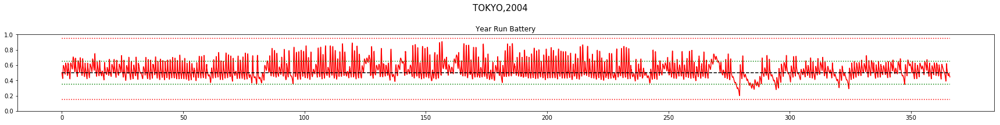

Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.29
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


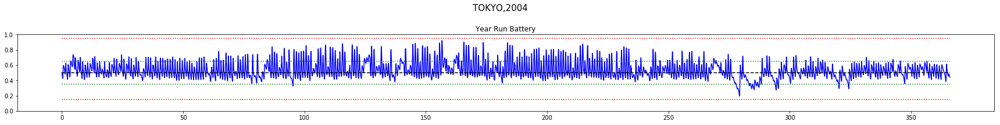


*****************************************
DAY: 60
REWARDS:  [ 1.612  1.879  1.707  1.751  1.392  1.288  1.832  1.421  1.963  1.837]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  14640
LOSS : 1.701

CHECKING... 


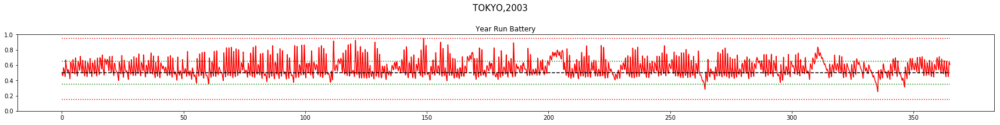

Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.08
Day Violations           =      1
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


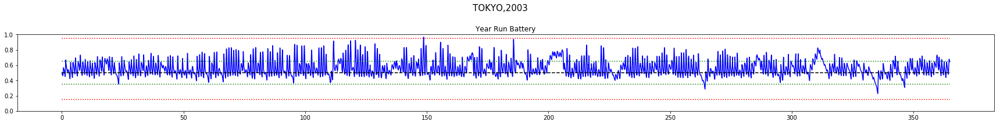


*****************************************
DAY: 61
REWARDS:  [ 1.431  0.927  0.535  0.209  1.515  1.580  1.204  1.152  1.936  0.494]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  14880

CHECKING... 


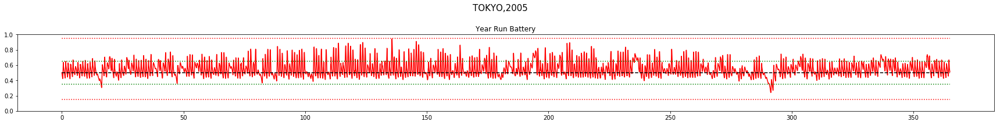

Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.33
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


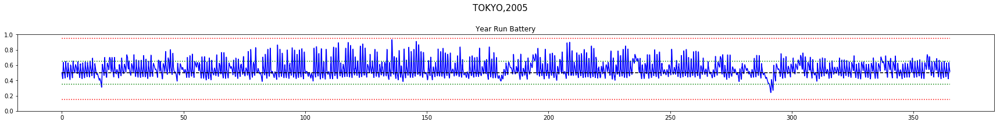


*****************************************
DAY: 62
REWARDS:  [ 1.849  0.503  1.857  1.996  1.992  1.202  1.512  1.652  1.604 -0.551]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  15120

CHECKING... 


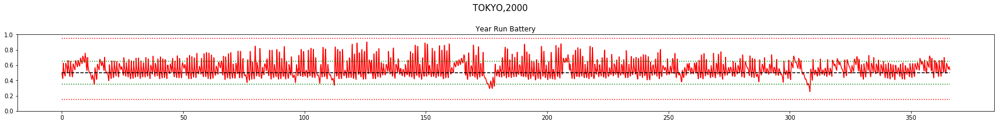

Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.33
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


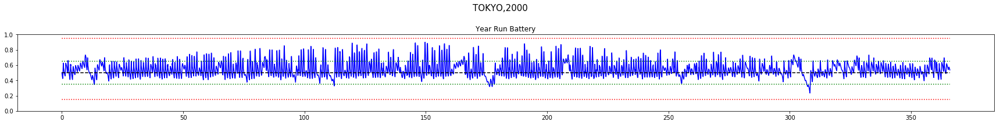


*****************************************
DAY: 63
REWARDS:  [ 0.893  1.760  1.303  1.849  1.934  1.401  1.577  1.838  1.499  1.466]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  15360

CHECKING... 


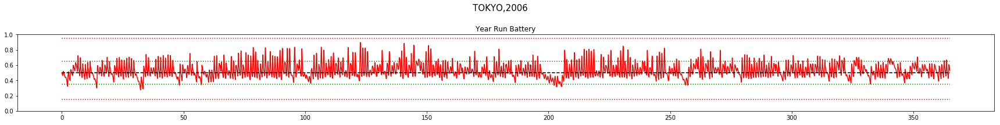

Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.34
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


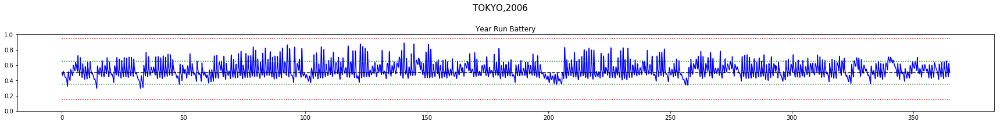


*****************************************
DAY: 64
REWARDS:  [-0.292  1.531  1.420  1.574  1.587  0.068  0.483  1.646  1.604 -0.209]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  15600

CHECKING... 


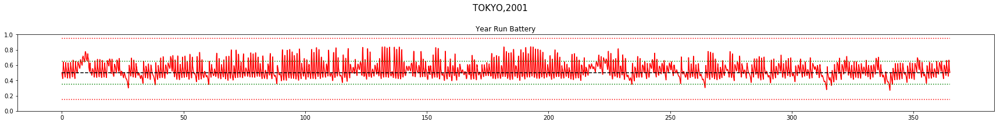

Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.34
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


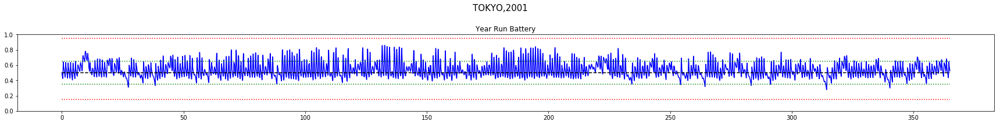


*****************************************
DAY: 65
REWARDS:  [-0.657  1.408  1.937  0.918  1.998  1.958  1.991  1.622  1.758  1.733]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  15840

CHECKING... 


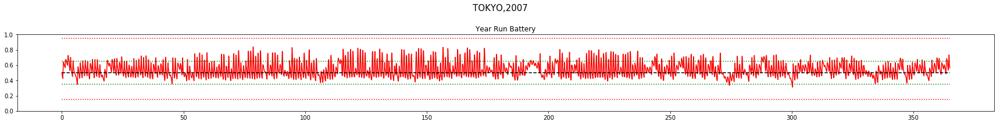

Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.30
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


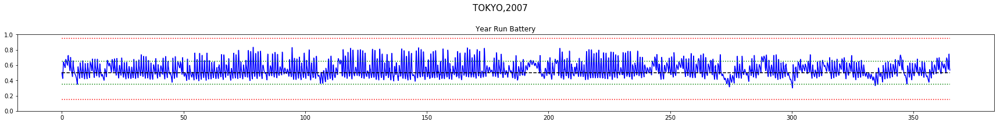


*****************************************
DAY: 66
REWARDS:  [ 1.508  1.876  1.443  1.513  1.722  1.919  1.786  1.809  1.815  1.720]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  16080

CHECKING... 


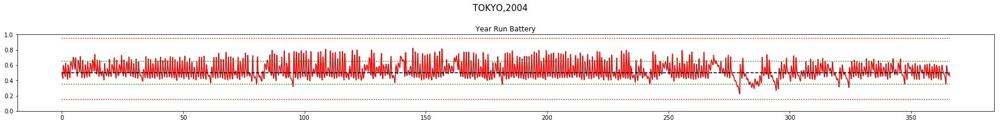

Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.37
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


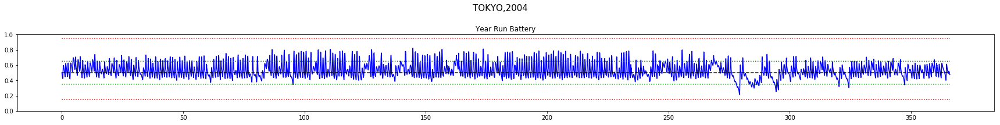


*****************************************
DAY: 67
REWARDS:  [ 1.951  1.507  1.949  1.582  1.873  1.749  1.869  1.757  1.921  1.080]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  16320

CHECKING... 


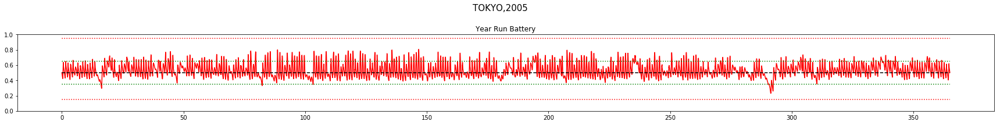

Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


************************************
Anuual Average Reward    =   1.33
Day Violations           =      2
Battery Limit Violations =     14
Battery FULL Violations  =      0
Battery EMPTY Violations =     14


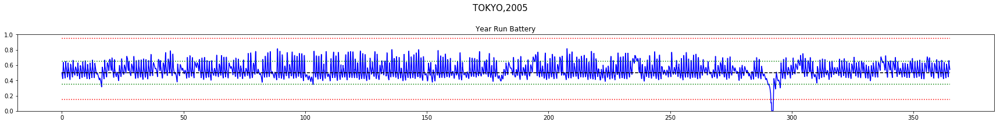


*****************************************
DAY: 68
REWARDS:  [ 1.730  1.625  1.432  1.713  1.948  0.618  1.867  1.287  1.597  1.476]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  16560

CHECKING... 


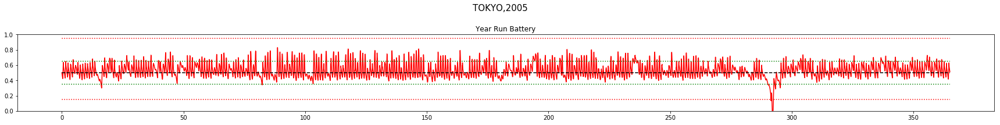

Day Violations           =      2
Battery Limit Violations =      9
Battery FULL Violations  =      0
Battery EMPTY Violations =      9


************************************
Anuual Average Reward    =   1.28
Day Violations           =      2
Battery Limit Violations =     15
Battery FULL Violations  =      0
Battery EMPTY Violations =     15


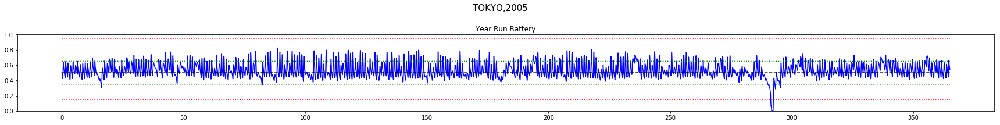


*****************************************
DAY: 69
REWARDS:  [ 1.532  1.742  1.894  1.759  1.496  1.715  1.345  1.420  0.513  1.546]
EMPTY  :  [21 38  0  0  0  0 51  0  0  0]
FULL   :  [0 0 0 0 0 0 0 0 0 0]
MEMORY:  16800

CHECKING... 


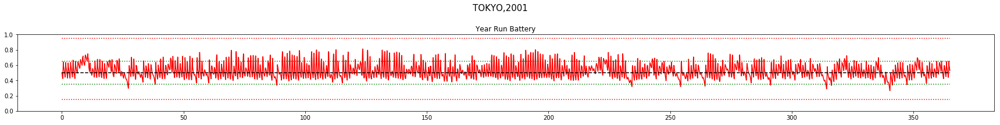

Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


In [ ]:
for day in range(360):
    table_list = [node_q_table]*NO_OF_NODES 
    day_list = [day]*NO_OF_NODES
    arglist = [arg for arg in zip(range(NO_OF_NODES),day_list, table_list)]
    result = pool.starmap(T_ENO, arglist)
    
    node_experience  = np.array([item[0] for item in result])
    node_reward      = np.array([item[1] for item in result])
    node_empty_count = np.array([item[2] for item in result])
    node_full_count  = np.array([item[3] for item in result])
    
    all_exp = np.array([item for each_node_exp in node_experience 
                                for episode_exp in each_node_exp 
                                    for item in episode_exp]).reshape(-1,10)

    dqn.memory = np.insert(dqn.memory, 0, all_exp , 0)
    dqn.memory = dqn.memory[:MEMORY_CAPACITY,:]
    dqn.memory_counter += all_exp.shape[0]

    print("\n*****************************************")
    print("DAY:", day)
    print("REWARDS: ", node_reward)
    print("EMPTY  : ", node_empty_count)
    print("FULL   : ", node_full_count)
    
    print("MEMORY: ",dqn.memory_counter)

   
    for nn_iter in range(NN_ITERATIONS):
        dqn.learn()
        #validate by running for TIMESTEP_LIMIT iterations
        
    print("\nCHECKING... ")
    # CHECKING NN MODEL
    ##########################################################################################################################
    LOCATION = 'tokyo'
    YEAR = random.choice(np.arange(2000,2010))

    capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
    capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
    capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

    s, r, day_end, year_end = capm.reset()
    yr_test_record = np.empty(4)

    while True:
        a = dqn.choose_greedy_action(stdize(s))
        #state = [batt, enp, henergy, fcast]
        yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

        # take action
        s_, r, day_end, year_end = capm.step(a)

        if year_end:
            break

        s = s_

    yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
    yr_test_reward_rec = yr_test_record[:,2]
    yr_test_reward_rec = yr_test_reward_rec[::24]

    title = LOCATION.upper() + ',' + str(YEAR)
    NO_OF_DAYS = capm.eno.NO_OF_DAYS

    fig = plt.figure(figsize=(24,3))
    fig.suptitle(title, fontsize=15)

    #     ax1 = fig.add_subplot(211)
    #     ax1.plot(yr_test_reward_rec)
    #     ax1.set_title("\n\nYear Run Reward")
    #     ax1.set_ylim([-3,3])

    #Plot the reward and battery for the entire year run
    ax2 = fig.add_subplot(111)
    ax2.plot(yr_test_record[:,0],'r')
    ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
    ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
    ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
    ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
    ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
    ax2.set_title("\n\nYear Run Battery")
    ax2.set_ylim([0,1])
    plt.sca(ax2)
    plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
    fig.tight_layout()
    plt.show()
    ##########################################################################################################################

    print("Day Violations           = {:6d}".format(capm.violation_counter))
    print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
    print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
    print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))
    
    # SAVE MODEL
    torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)
    best_dqn = DQN()
    best_dqn.eval_net.load_state_dict(torch.load(MODEL_FILENAME))
    best_dqn.eval_net.eval()
    node_q_table = best_dqn.get_qvals(std_state_combinations).reshape(GRANULARITY,GRANULARITY,GRANULARITY,GRANULARITY,-1)
    
    
        
    # CHECKING TABULAR MODEL
    ##########################################################################################################################
    s, r, day_end, year_end = capm.reset()
    yr_test_record = np.empty(4)

    while True:
        batt_val, enp_val, henergy_val, fcast_val = denormalize(s).flatten()
        discrete_s = discretize(batt_val, enp_val, henergy_val, fcast_val)

        a = node_q_table[tuple(discrete_s)].argmax()

        #state = [batt, enp, henergy, fcast]
        yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

        # take action
        s_, r, day_end, year_end = capm.step(a)

        if year_end:
            break

        s = s_

    yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
    yr_test_reward_rec = yr_test_record[:,2]
    yr_test_reward_rec = yr_test_reward_rec[::24]

    print("\n\n************************************")
    print("Anuual Average Reward    = {:6.2f}".format(np.mean(yr_test_reward_rec)))
    print("Day Violations           = {:6d}".format(capm.violation_counter))
    print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
    print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
    print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))

    title = LOCATION.upper() + ',' + str(YEAR)
    NO_OF_DAYS = capm.eno.NO_OF_DAYS

    fig = plt.figure(figsize=(24,3))
    fig.suptitle(title, fontsize=15)

    #     ax1 = fig.add_subplot(211)
    #     ax1.plot(yr_test_reward_rec)
    #     ax1.set_title("\n\nYear Run Reward")
    #     ax1.set_ylim([-3,3])

    #Plot the reward and battery for the entire year run
    ax2 = fig.add_subplot(111)
    ax2.plot(yr_test_record[:,0],'b')
    ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
    ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
    ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
    ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
    ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
    ax2.set_title("\n\nYear Run Battery")
    ax2.set_ylim([0,1])
    plt.sca(ax2)
    plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
    fig.tight_layout()
    plt.show()
    ##########################################################################################################################

    
    
pool.close()
pool.join()
    
    

In [ ]:
pool.close()
pool.join()

In [ ]:
# TESTING THE DISCRETE Q-TABLE
# YEAR = 2007

# capm = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
# capm.eno = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
# capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

# s, r, day_end, year_end = capm.reset()
# yr_test_record = np.empty(4)

# while True:
#     batt_val, enp_val, henergy_val, fcast_val = denormalize(s).flatten()
#     discrete_s = discretize(batt_val, enp_val, henergy_val, fcast_val)
    
#     a = Q_TABLE[tuple(discrete_s)].argmax()

#     #state = [batt, enp, henergy, fcast]
#     yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action

#     # take action
#     s_, r, day_end, year_end = capm.step(a)

#     if year_end:
#         break

#     s = s_

# yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
# yr_test_reward_rec = yr_test_record[:,2]
# yr_test_reward_rec = yr_test_reward_rec[::24]

# print("\n\n************************************")
# print("Anuual Average Reward    = {:6.2f}".format(np.mean(yr_test_reward_rec)))
# print("Day Violations           = {:6d}".format(capm.violation_counter))
# print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
# print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
# print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))

# title = LOCATION.upper() + ',' + str(YEAR)
# NO_OF_DAYS = capm.eno.NO_OF_DAYS

# fig = plt.figure(figsize=(24,6))
# fig.suptitle(title, fontsize=15)

# #     ax1 = fig.add_subplot(211)
# #     ax1.plot(yr_test_reward_rec)
# #     ax1.set_title("\n\nYear Run Reward")
# #     ax1.set_ylim([-3,3])

# #Plot the reward and battery for the entire year run
# ax2 = fig.add_subplot(111)
# ax2.plot(yr_test_record[:,0],'r')
# ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
# ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
# ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
# ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
# ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')
# ax2.set_title("\n\nYear Run Battery")
# ax2.set_ylim([0,1])
# plt.sca(ax2)
# plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
# fig.tight_layout()
# plt.show()

# DAY_START = 260
# DAY_END   = 280

# #Plot the reward and battery for the entire year run on a day by day basis
# title = LOCATION.upper() + ',' + str(YEAR)
# TIME_AXIS = np.arange(0,capm.eno.TIME_STEPS)
# for DAY in range(DAY_START,DAY_END):
#     START = DAY*24
#     END = START+24

#     daytitle = title + ' - DAY ' + str(DAY)
#     fig = plt.figure(figsize=(16,4))
#     st = fig.suptitle(daytitle)

#     ax2 = fig.add_subplot(121)
#     ax2.plot(yr_test_record[START:END,1],'g')
#     ax2.set_title("HARVESTED ENERGY")
#     ax2.set_xlabel("Hour")
#     ax2.set_ylim([0,1.05])
    
#     ax2.text(0.1, 0.6, "TENP = %.2f\n" %(capm.BOPT/capm.BMAX-yr_test_record[END,0]),fontsize=11, ha='left')
#     ax2.text(0.1, 0.5, "BMEAN = %.2f\n" %(np.mean(yr_test_record[START:END,0])),fontsize=11, ha='left')
#     ax2.text(0.1, 0.4, "BINIT = %.2f\n" %(yr_test_record[START,0]),fontsize=11, ha='left')
#     if END < (capm.eno.NO_OF_DAYS*capm.eno.TIME_STEPS):
#         ax2.text(0.1, 0.1, "REWARD = %.2f\n" %(yr_test_record[END,2]),fontsize=13, ha='left')
        
#     #plot battery for year run
#     ax1 = fig.add_subplot(122)
#     ax1.plot(TIME_AXIS,              yr_test_record[START:END,0],'r')
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BOPT/capm.BMAX, 'r--')
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BLIM_LO/capm.BMAX, 'r-.',alpha=0.5)
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*capm.BLIM_HI/capm.BMAX, 'r-.',alpha=0.5)
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:',alpha=0.5)
#     ax1.plot(TIME_AXIS, np.ones_like(yr_test_record[START:END,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:',alpha=0.5)
    
#     ax1.set_title("YEAR RUN TEST")
#     ax1.set_xlabel("Hour")
#     ax1.set_ylabel('Battery', color='r',fontsize=12)
#     ax1.set_ylim([-0.05,1.05])

#     #plot actions for year run
#     ax1a = ax1.twinx()
#     ax1a.plot(yr_test_record[START:END,3]+1)
#     ax1a.set_ylim([0,N_ACTIONS])
#     ax1a.set_ylabel('Duty Cycle', color='b',fontsize=12)
#     ax1a.set_ylim([0,10.25])


#     fig.tight_layout()
#     st.set_y(0.95)
#     fig.subplots_adjust(top=0.75)
#     plt.show()